# Проект по анализу социальной сети

In [ ]:
!pip install vk-api python-dotenv

In [ ]:
import vk_api
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import numpy as np
import os
import pandas as pd
from dotenv import load_dotenv
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform
from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import cosine
from numpy import corrcoef
import scipy.stats as stats
from scipy.stats import kstest

## Сбор данных

In [ ]:
load_dotenv()
access_token = os.getenv("VK_ACCESS_TOKEN")

In [ ]:
vk_session = vk_api.VkApi(token=access_token)
vk = vk_session.get_api()

user_id = vk.users.get()[0]['id']
user_info = vk.users.get(user_ids=user_id, fields="city")
friends = vk.friends.get(user_id=user_id, fields="id,first_name,last_name,domain,sex,photo_50,bdate,city")['items']

G = nx.Graph()


G.add_node(user_id,
           name=user_info[0].get('first_name'),
           surname=user_info[0].get('last_name'),
           screen_name=user_info[0].get('domain', ''),
           sex=user_info[0].get('sex', ''),
           photo=user_info[0].get('photo_50', ''),
           bdate=user_info[0].get('bdate', ''),
           city=user_info[0].get('city', {}).get('title', 'N/A'))

for friend in friends:
    friend_id = friend['id']
    G.add_node(friend_id,
               name=friend.get('first_name', ''),
               surname=friend.get('last_name', ''),
               screen_name=friend.get('domain', ''),
               sex=friend.get('sex', ''),
               photo=friend.get('photo_50', ''),
               bdate=friend.get('bdate', ''),
               city=friend.get('city', {}).get('title', 'N/A'))
    G.add_edge(user_id, friend_id)

    try:
        friend_friends = vk.friends.get(user_id=friend_id, fields="id,city")['items']
        for sub_friend in friend_friends:
            sub_friend_id = sub_friend['id']
            if sub_friend_id in G.nodes:
                G.add_edge(friend_id, sub_friend_id)
    except vk_api.exceptions.ApiError as e:
        print(f"Не удалось получить друзей для пользователя {friend_id}: {e}")

Не удалось получить друзей для пользователя 467456064: [18] User was deleted or banned


Визуализация с центральной нодой

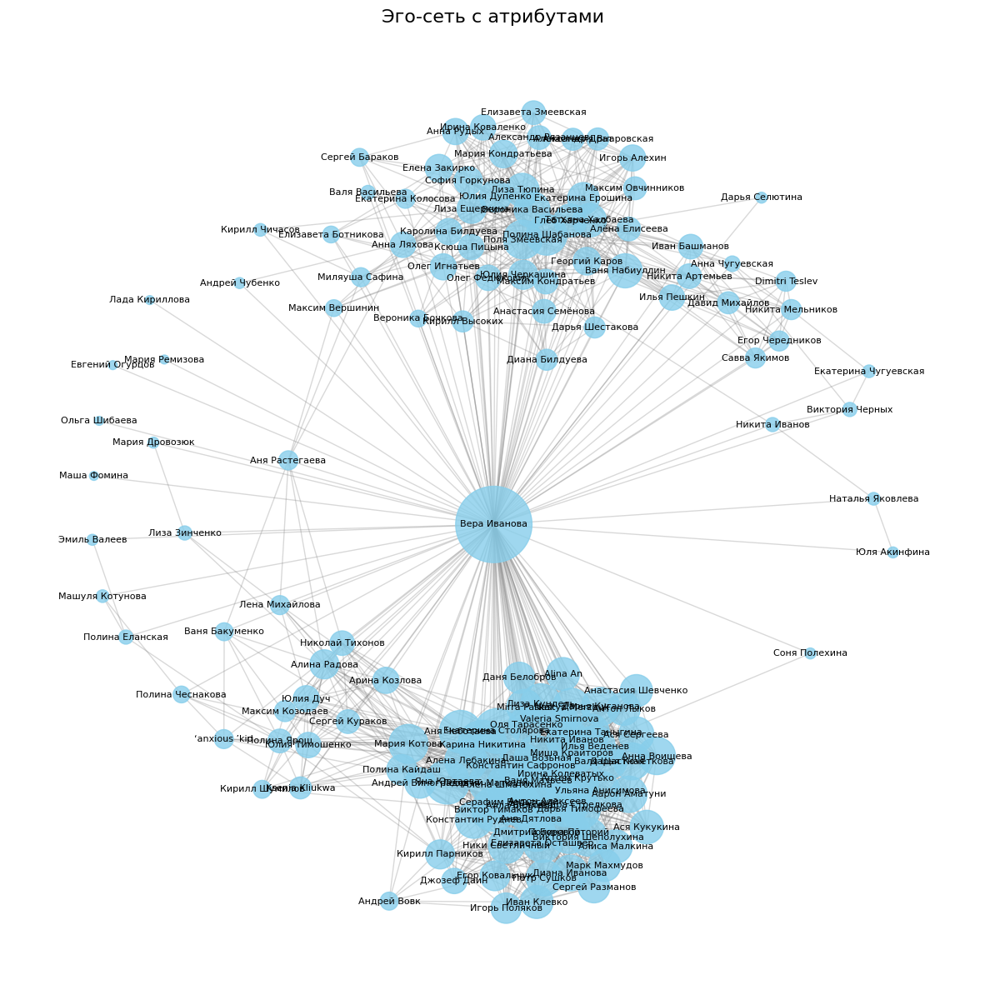

In [ ]:
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G)
node_sizes = [30 * (G.degree(node) + 1) for node in G.nodes()]
nx.draw_networkx_nodes(G, pos,
                       node_size=node_sizes,
                       node_color="skyblue",
                       alpha=0.8)
nx.draw_networkx_edges(G, pos,
                       edge_color="gray",
                       alpha=0.3)
labels = {node: f"{G.nodes[node]['name']} {G.nodes[node]['surname']}" for node in G.nodes()}
nx.draw_networkx_labels(G, pos, labels=labels, font_size=8)
plt.title("Эго-сеть с атрибутами", fontsize=16)
plt.axis("off")
plt.show()

In [ ]:
G.remove_node(user_id)
isolated_nodes = [node for node in G.nodes if G.degree(node) == 0]
print(f"Количество изолированных нод: {len(isolated_nodes)}")

Количество изолированных нод: 5


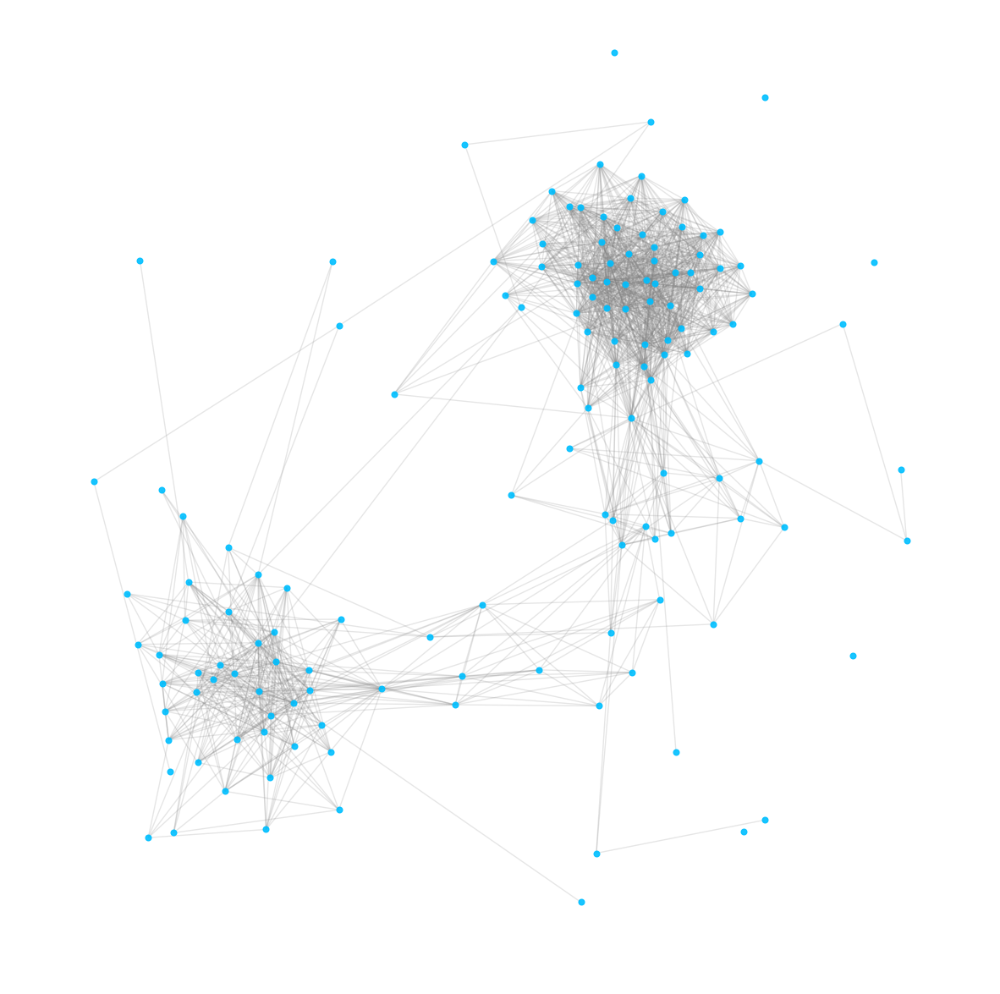

In [ ]:
pos = nx.spring_layout(G, k=0.5, iterations=50)

plt.figure(figsize=(15, 15))
node_size = 23
nx.draw_networkx_nodes(
    G,
    pos,
    node_size=node_size,
    node_color="deepskyblue",
    alpha=0.9
)
nx.draw_networkx_edges(
    G,
    pos,
    edge_color="gray",
    alpha=0.2
)
plt.axis("off")

plt.savefig("ego_network.png", format="png", dpi=300)
plt.show()

/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py:457: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


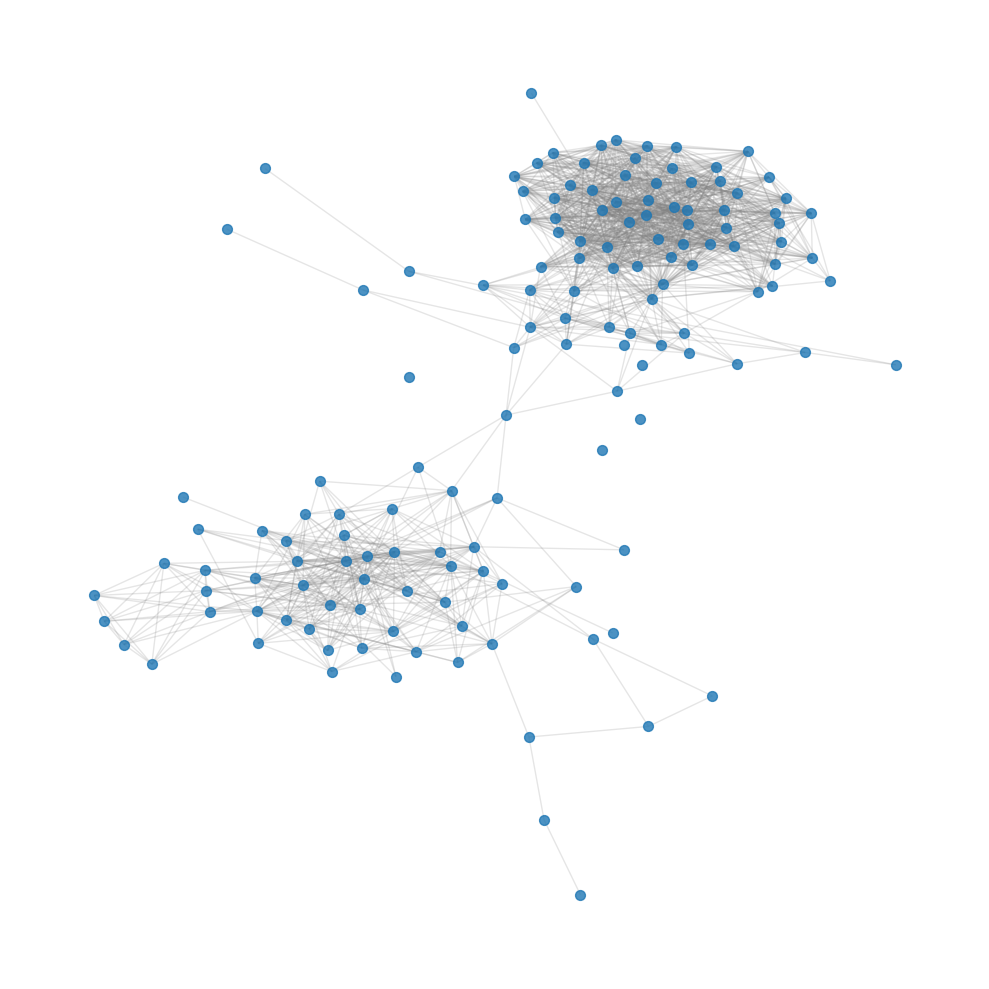

In [ ]:
plt.figure(figsize=(10, 10))

nodes = nx.draw_networkx_nodes(
    G,
    nx.kamada_kawai_layout(G),
    cmap=plt.cm.Set3,
    node_color="tab:blue",
    node_size=50,
    alpha=0.8
)
nx.draw_networkx_edges(
    G,
    nx.kamada_kawai_layout(G),
    alpha=0.2,
    edge_color="gray"
)

plt.axis("off")
plt.tight_layout()
plt.savefig("original_graph_visualization.png", dpi=300)
plt.show()

## Основные характеристики

In [ ]:
if nx.is_connected(G):
    diameter = nx.diameter(G)
    radius = nx.radius(G)
    components = 1
else:
    components = nx.number_connected_components(G)
    largest_component = max(nx.connected_components(G), key=len)
    largest_subgraph = G.subgraph(largest_component)
    diameter = nx.diameter(largest_subgraph)
    radius = nx.radius(largest_subgraph)

num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()
connected_components = list(nx.connected_components(G))

print(f"Число вершин: {num_nodes}")
print(f"Число ребер: {num_edges}")
print(f"Диаметр: {diameter}")
print(f"Радиус: {radius}")
print(f"Число компонент связности: {components}")

Число вершин: 144
Число ребер: 1465
Диаметр: 10
Радиус: 5
Число компонент связности: 6


Глобальный коэффициент кластеризации: 0.6180
Средний локальный коэффициент кластеризации: 0.5709


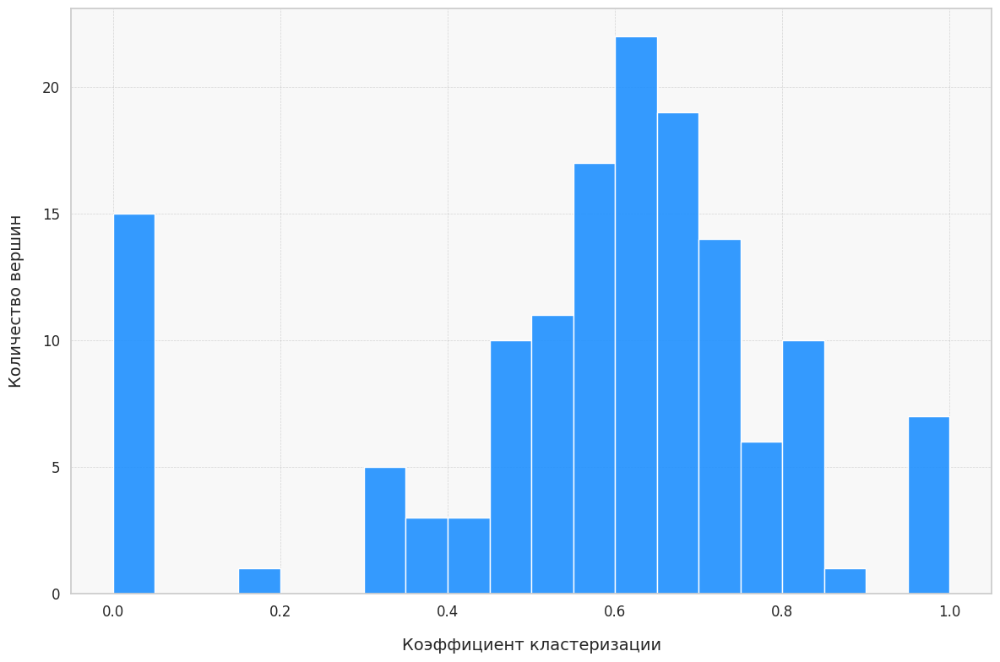

In [ ]:
global_clustering = nx.transitivity(G)
average_local_clustering = nx.average_clustering(G)
local_clustering = nx.clustering(G)
print(f"Глобальный коэффициент кластеризации: {global_clustering:.4f}")
print(f"Средний локальный коэффициент кластеризации: {average_local_clustering:.4f}")

clustering_values = list(local_clustering.values())

# Настройка стиля графиков
sns.set(style="whitegrid")
sns.set_palette("deep")

plt.figure(figsize=(12, 8))
sns.histplot(clustering_values, bins=20, color="dodgerblue", alpha=0.9, kde=False)

plt.grid(visible=True, which="major", color="gray", linestyle="--", linewidth=0.5, alpha=0.3)
plt.gca().set_facecolor('#f8f8f8')

plt.xlabel("Коэффициент кластеризации", fontsize=14, labelpad=15)
plt.ylabel("Количество вершин", fontsize=14, labelpad=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.savefig("local_clustering_histogram.png", dpi=300)
plt.show()

Средняя длина кратчайшего пути: 3.7142


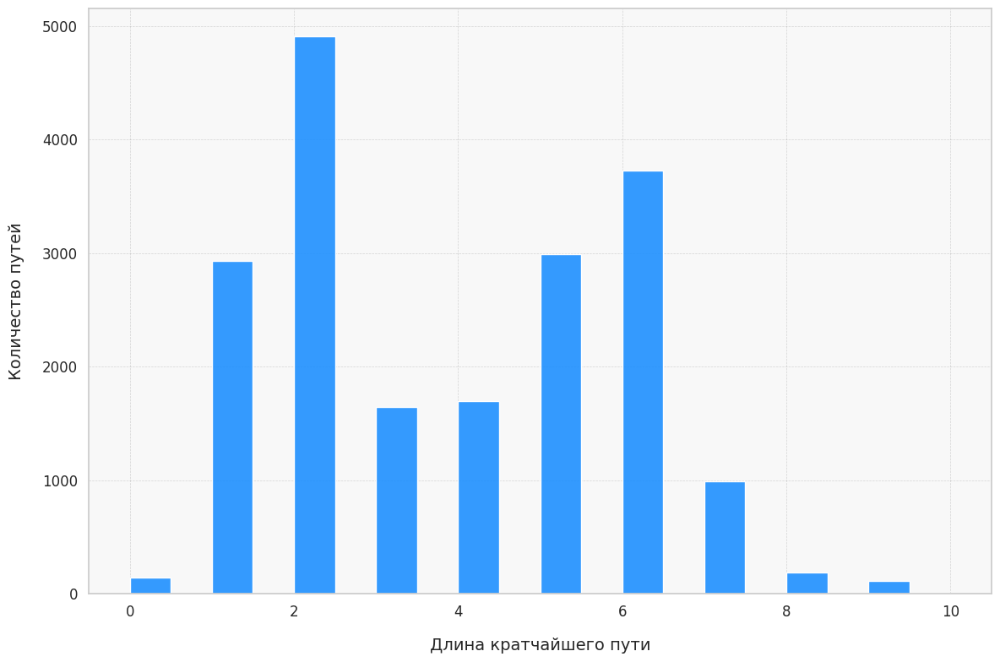

In [ ]:
shortest_path_lengths = dict(nx.all_pairs_shortest_path_length(G))
path_lengths = [length for paths in shortest_path_lengths.values() for length in paths.values()]
average_shortest_path_length = nx.average_shortest_path_length(largest_subgraph)
print(f"Средняя длина кратчайшего пути: {average_shortest_path_length:.4f}")

plt.figure(figsize=(12, 8))
sns.histplot(path_lengths, bins=20, color="dodgerblue", alpha=0.9, kde=False)
plt.grid(visible=True, which="major", color="gray", linestyle="--", linewidth=0.5, alpha=0.3)
plt.gca().set_facecolor('#f8f8f8')
plt.xlabel("Длина кратчайшего пути", fontsize=14, labelpad=15)
plt.ylabel("Количество путей", fontsize=14, labelpad=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.savefig("shortest_path_length_histogram.png", dpi=300)
plt.show()

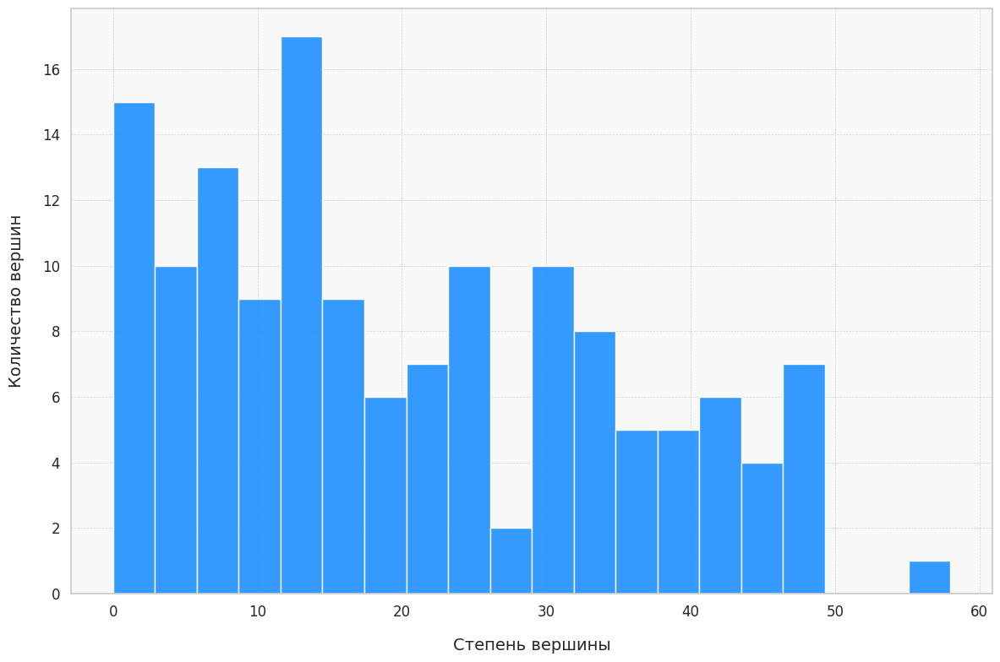

In [ ]:
degree_sequence = [degree for _, degree in G.degree()]

plt.figure(figsize=(12, 8))
sns.histplot(degree_sequence, bins=20, color="dodgerblue", alpha=0.9, kde=False)

plt.grid(visible=True, which="major", color="gray", linestyle="--", linewidth=0.5, alpha=0.3)
plt.gca().set_facecolor('#f8f8f8')

plt.xlabel("Степень вершины", fontsize=14, labelpad=15)
plt.ylabel("Количество вершин", fontsize=14, labelpad=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()
plt.savefig("degree_distribution_histogram.png", dpi=300)
plt.show()


In [ ]:
degree_sequence = np.array([degree for _, degree in G.degree()])

def power_law_cdf(k, alpha, k_min):
    return 1 - (k / k_min) ** (1 - alpha)

def power_law_pdf(k, alpha, k_min):
    return (alpha - 1) / k_min * (k / k_min) ** -alpha

def mle_power_law_params(degree_sequence):
    best_alpha, best_k_min = None, None
    best_ks_statistic = float('inf')
    for k_min in np.unique(np.round(degree_sequence)):
        filtered_degrees = degree_sequence[degree_sequence >= k_min]
        n = len(filtered_degrees)
        if n == 0 or np.all(filtered_degrees == k_min):
            continue
        alpha = 1 + n / np.sum(np.log(filtered_degrees / k_min))
        ks_statistic, _ = kstest(filtered_degrees, power_law_cdf, args=(alpha, k_min))
        if ks_statistic < best_ks_statistic:
            best_ks_statistic = ks_statistic
            best_alpha = alpha
            best_k_min = k_min
    return best_alpha, best_k_min

<ipython-input-13-165dc31b6731>:17: RuntimeWarning: divide by zero encountered in divide
  alpha = 1 + n / np.sum(np.log(filtered_degrees / k_min))
<ipython-input-13-165dc31b6731>:17: RuntimeWarning: invalid value encountered in divide
  alpha = 1 + n / np.sum(np.log(filtered_degrees / k_min))
<ipython-input-13-165dc31b6731>:4: RuntimeWarning: divide by zero encountered in divide
  return 1 - (k / k_min) ** (1 - alpha)
<ipython-input-13-165dc31b6731>:4: RuntimeWarning: invalid value encountered in divide
  return 1 - (k / k_min) ** (1 - alpha)


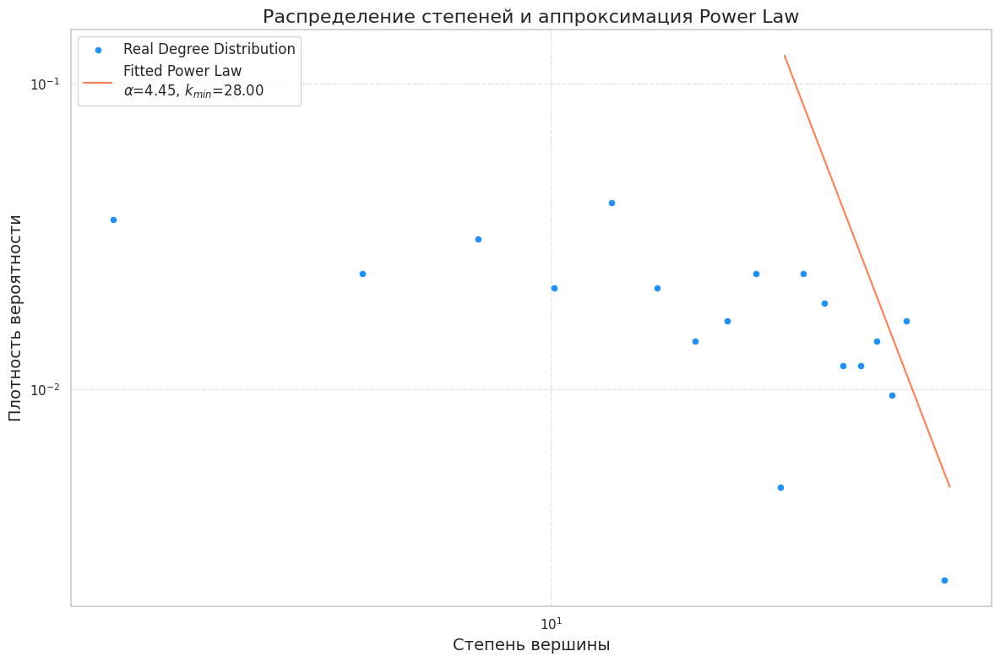

(4.453730916637477, 28)

In [ ]:
hat_alpha, hat_k_min = mle_power_law_params(degree_sequence)

hist, bin_edges = np.histogram(degree_sequence, bins=20, density=True)
bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2

plt.figure(figsize=(12, 8))
plt.scatter(bin_centers[hist > 0], hist[hist > 0], s=20, label="Real Degree Distribution", color="dodgerblue")
x_space = np.linspace(hat_k_min, degree_sequence.max(), 100)
plt.plot(x_space, power_law_pdf(x_space, hat_alpha, hat_k_min), label=f'Fitted Power Law\n$\\alpha$={hat_alpha:.2f}, $k_{{min}}$={hat_k_min:.2f}', color="coral")

plt.xscale("log")
plt.yscale("log")
plt.xlabel("Степень вершины", fontsize=14)
plt.ylabel("Плотность вероятности", fontsize=14)
plt.title("Распределение степеней и аппроксимация Power Law", fontsize=16)
plt.grid(visible=True, which="major", linestyle="--", alpha=0.5)
plt.legend(fontsize=12)
plt.tight_layout()
plt.savefig("degree_distribution_powerlaw_fit.png", dpi=300)
plt.show()

hat_alpha, hat_k_min

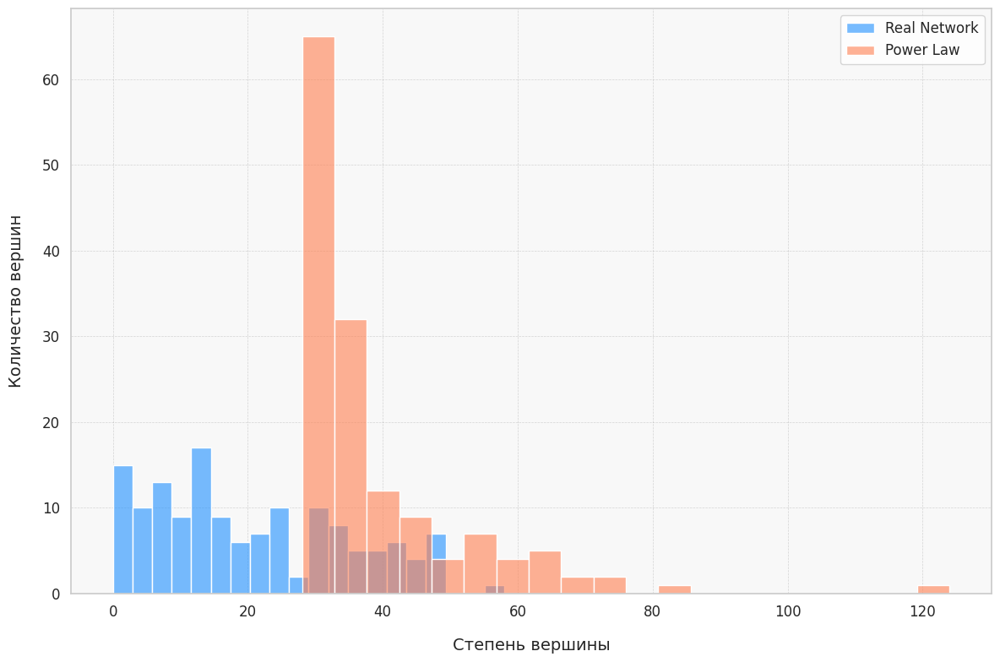

In [ ]:
degree_sequence = np.array([degree for _, degree in G.degree()])
min_real_degree = degree_sequence.min()
def power_law_ppf(r, alpha=3.5, x_min=1):
    power_law_ppf = x_min / (1 - r)**(1 / (alpha - 1))
    return power_law_ppf

def power_law_generate(n, alpha=3.5, x_min=1, random_seed=12):
    np.random.seed(random_seed)
    uni_sample = np.random.uniform(0, 0.999, n)
    return power_law_ppf(uni_sample, alpha, x_min)

powerlaw_degree_sequence = power_law_generate(len(degree_sequence), hat_alpha, max(hat_k_min, min_real_degree))

def plot_degree_distribution(real_seq, model_seq, model_name, filename):
    plt.figure(figsize=(12, 8))
    sns.histplot(real_seq, bins=20, color="dodgerblue", alpha=0.6, label="Real Network", kde=False)
    sns.histplot(model_seq, bins=20, color="coral", alpha=0.6, label=model_name, kde=False)
    plt.grid(visible=True, which="major", color="gray", linestyle="--", linewidth=0.5, alpha=0.3)
    plt.gca().set_facecolor('#f8f8f8')
    plt.xlabel("Степень вершины", fontsize=14, labelpad=15)
    plt.ylabel("Количество вершин", fontsize=14, labelpad=15)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(fontsize=12)
    plt.tight_layout()
    plt.savefig(filename, dpi=300)
    plt.show()

plot_degree_distribution(degree_sequence, powerlaw_degree_sequence, "Power Law", "degree_distribution_real_vs_powerlaw.png")


## Структурный анализ

#### Ближайшая к вашей сети модель случайного графа (сравните модели из лекций, такие как ER, BA, WS). Проверьте 3 свойства реальных сетей на выбранных моделях случайных графов и вашей эго-сети, сравните результаты.

In [ ]:
num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()

# Генерация моделей случайных графов
# ER граф
p = 2 * num_edges / (num_nodes * (num_nodes - 1))
er_graph = nx.erdos_renyi_graph(num_nodes, p)

# BA граф
ba_graph = nx.barabasi_albert_graph(num_nodes, int(num_edges / num_nodes))

# WS граф
k_neighbors = int(2 * num_edges / num_nodes)
ws_graph = nx.watts_strogatz_graph(num_nodes, k_neighbors, p=0.1)

In [ ]:
def calculate_graph_properties(graph):
    largest_component = max(nx.connected_components(graph), key=len)
    largest_subgraph = graph.subgraph(largest_component)
    properties = {
        "Nodes": graph.number_of_nodes(),
        "Edges": graph.number_of_edges(),
        "Average Degree": 2 * graph.number_of_edges() / graph.number_of_nodes(),
        "Global Clustering Coefficient": nx.transitivity(graph),
        "Average Local Clustering Coefficient": nx.average_clustering(graph),
        "Average Shortest Path Length": nx.average_shortest_path_length(largest_subgraph),
        "Diameter": nx.diameter(largest_subgraph)
    }
    return properties



In [ ]:
def tune_graph_models(G, num_iterations=10):
    best_er, best_ba, best_ws = None, None, None
    best_er_diff, best_ba_diff, best_ws_diff = float('inf'), float('inf'), float('inf')

    real_avg_deg = 2 * G.number_of_edges() / G.number_of_nodes()
    real_clustering = nx.average_clustering(G)

    for _ in range(num_iterations):
        # ER Graph
        p = 2 * G.number_of_edges() / (G.number_of_nodes() * (G.number_of_nodes() - 1))
        er_graph = nx.erdos_renyi_graph(G.number_of_nodes(), p)
        er_avg_deg = 2 * er_graph.number_of_edges() / er_graph.number_of_nodes()
        er_clustering = nx.average_clustering(er_graph)
        er_diff = abs(er_avg_deg - real_avg_deg) + abs(er_clustering - real_clustering)

        if er_diff < best_er_diff:
            best_er, best_er_diff = er_graph, er_diff

        # BA Graph
        ba_graph = nx.barabasi_albert_graph(G.number_of_nodes(), max(1, int(real_avg_deg / 2)))
        ba_avg_deg = 2 * ba_graph.number_of_edges() / ba_graph.number_of_nodes()
        ba_clustering = nx.average_clustering(ba_graph)
        ba_diff = abs(ba_avg_deg - real_avg_deg) + abs(ba_clustering - real_clustering)

        if ba_diff < best_ba_diff:
            best_ba, best_ba_diff = ba_graph, ba_diff

        # WS Graph
        k_neighbors = max(2, int(real_avg_deg))
        ws_graph = nx.watts_strogatz_graph(G.number_of_nodes(), k_neighbors, p=0.10)
        ws_avg_deg = 2 * ws_graph.number_of_edges() / ws_graph.number_of_nodes()
        ws_clustering = nx.average_clustering(ws_graph)
        ws_diff = abs(ws_avg_deg - real_avg_deg) + abs(ws_clustering - real_clustering)

        if ws_diff < best_ws_diff:
            best_ws, best_ws_diff = ws_graph, ws_diff

    return best_er, best_ba, best_ws

In [ ]:
er_graph, ba_graph, ws_graph = tune_graph_models(G, num_iterations=20)

properties_real = calculate_graph_properties(G)
properties_er = calculate_graph_properties(er_graph)
properties_ba = calculate_graph_properties(ba_graph)
properties_ws = calculate_graph_properties(ws_graph)


comparison_df = pd.DataFrame(
    [properties_real, properties_er, properties_ba, properties_ws],
    index=["Real Network", "Erdős–Rényi", "Barabási–Albert", "Watts–Strogatz"]
)
comparison_df

,Nodes,Edges,Average Degree,Global Clustering Coefficient,Average Local Clustering Coefficient,Average Shortest Path Length,Diameter
Real Network,144,1465,20.347222,0.618002,0.570932,3.714211,10
Erdős–Rényi,144,1462,20.305556,0.143055,0.143432,1.906177,3
Barabási–Albert,144,1340,18.611111,0.212043,0.235862,1.949786,3
Watts–Strogatz,144,1440,20.000000,0.545931,0.548678,2.272727,4


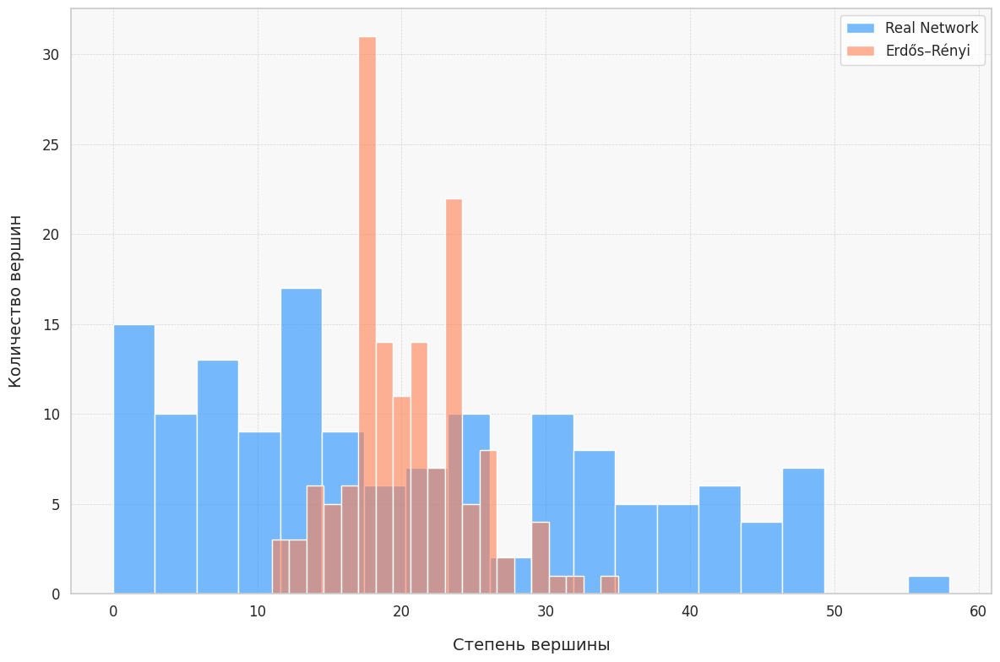

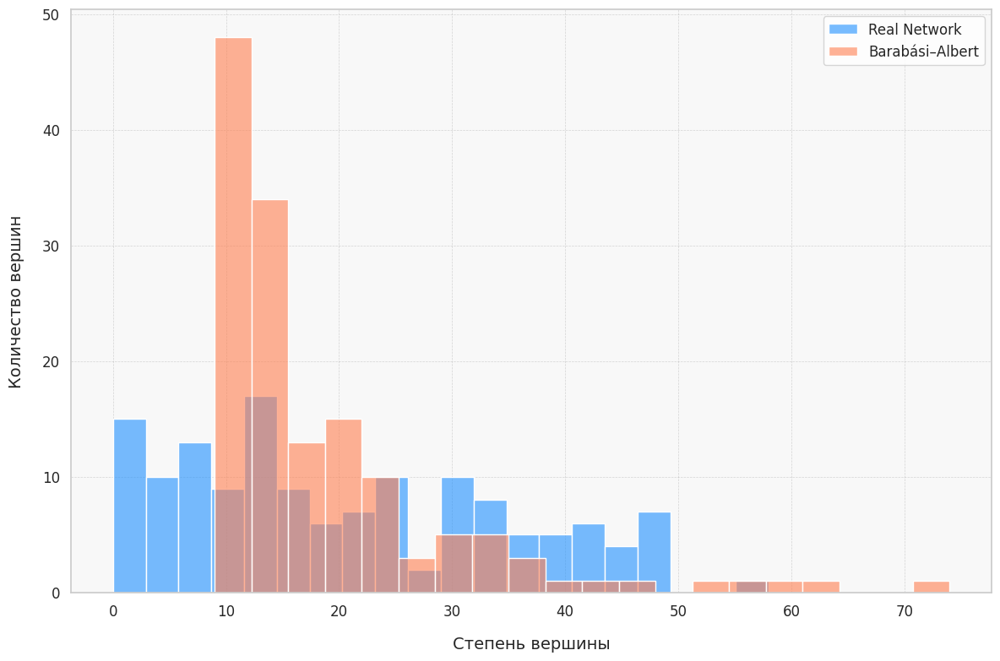

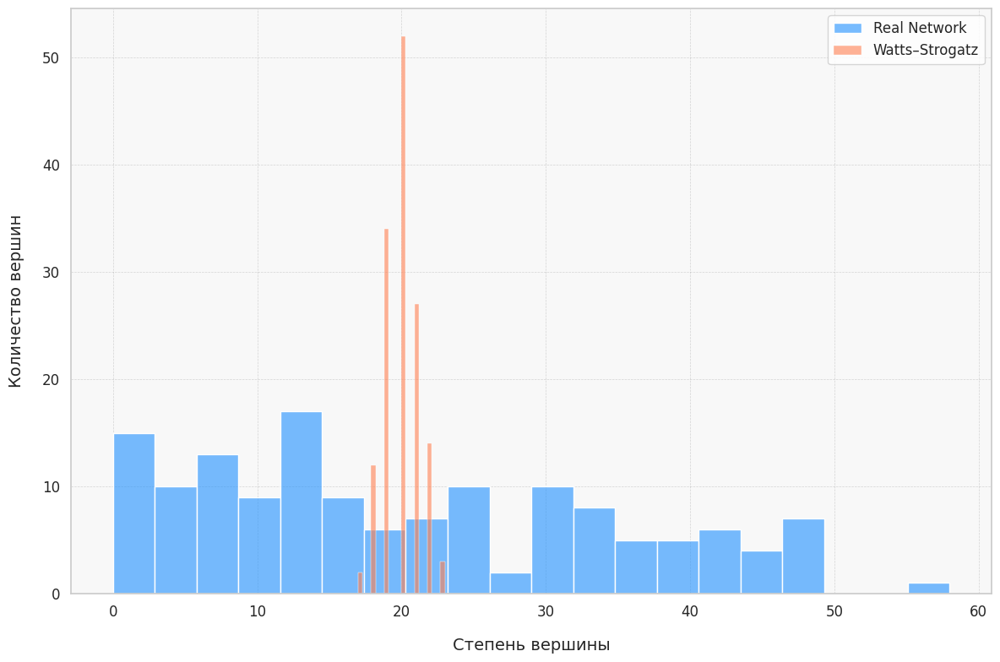

In [ ]:
real_degree_sequence = [degree for _, degree in G.degree()]
er_degree_sequence = [degree for _, degree in er_graph.degree()]
ba_degree_sequence = [degree for _, degree in ba_graph.degree()]
ws_degree_sequence = [degree for _, degree in ws_graph.degree()]

def plot_degree_distribution(real_seq, model_seq, model_name, filename):
    plt.figure(figsize=(12, 8))
    sns.histplot(real_seq, bins=20, color="dodgerblue", alpha=0.6, label="Real Network", kde=False)
    sns.histplot(model_seq, bins=20, color="coral", alpha=0.6, label=model_name, kde=False)
    plt.grid(visible=True, which="major", color="gray", linestyle="--", linewidth=0.5, alpha=0.3)
    plt.gca().set_facecolor('#f8f8f8')
    plt.xlabel("Степень вершины", fontsize=14, labelpad=15)
    plt.ylabel("Количество вершин", fontsize=14, labelpad=15)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(fontsize=12)
    plt.tight_layout()
    plt.savefig(filename, dpi=300)
    plt.show()

plot_degree_distribution(real_degree_sequence, er_degree_sequence, "Erdős–Rényi", "degree_distribution_real_vs_er.png")
plot_degree_distribution(real_degree_sequence, ba_degree_sequence, "Barabási–Albert", "degree_distribution_real_vs_ba.png")
plot_degree_distribution(real_degree_sequence, ws_degree_sequence, "Watts–Strogatz", "degree_distribution_real_vs_ws.png")

In [ ]:
def power_law_cdf(k, alpha=3, k_min=1):
    return 1 - (k / k_min) ** (1 - alpha)

def mle_power_law_params(degree_sequence):
    best_alpha, best_k_min = None, None
    min_ks_dist = float('inf')
    for k_min in np.arange(degree_sequence.min(), degree_sequence.max()):
        filtered_degrees = degree_sequence[degree_sequence >= k_min]
        if len(filtered_degrees) < 2:  # Для оценки нужно как минимум два значения
            continue
        alpha = 1 + len(filtered_degrees) / np.log(filtered_degrees / k_min).sum()
        ks_dist = stats.kstest(filtered_degrees, power_law_cdf, args=(alpha, k_min)).statistic
        if ks_dist < min_ks_dist:
            best_alpha, best_k_min, min_ks_dist = alpha, k_min, ks_dist
    return best_alpha, best_k_min

degree_sequence = np.array([degree for _, degree in G.degree()])
alpha_real, k_min_real = mle_power_law_params(degree_sequence)

n = G.number_of_nodes()
m = int(G.number_of_edges() / G.number_of_nodes())
ba_graph = nx.barabasi_albert_graph(n, m)
ba_degree_sequence = np.array([degree for _, degree in ba_graph.degree()])
alpha_ba, k_min_ba = mle_power_law_params(ba_degree_sequence)

(alpha_real, k_min_real), (alpha_ba, k_min_ba)

<ipython-input-21-6b1ca18c94a1>:11: RuntimeWarning: divide by zero encountered in divide
  alpha = 1 + len(filtered_degrees) / np.log(filtered_degrees / k_min).sum()
<ipython-input-21-6b1ca18c94a1>:11: RuntimeWarning: invalid value encountered in divide
  alpha = 1 + len(filtered_degrees) / np.log(filtered_degrees / k_min).sum()
<ipython-input-21-6b1ca18c94a1>:2: RuntimeWarning: divide by zero encountered in divide
  return 1 - (k / k_min) ** (1 - alpha)
<ipython-input-21-6b1ca18c94a1>:2: RuntimeWarning: invalid value encountered in divide
  return 1 - (k / k_min) ** (1 - alpha)


((4.453730916637477, 28), (3.5738841639887537, 18))

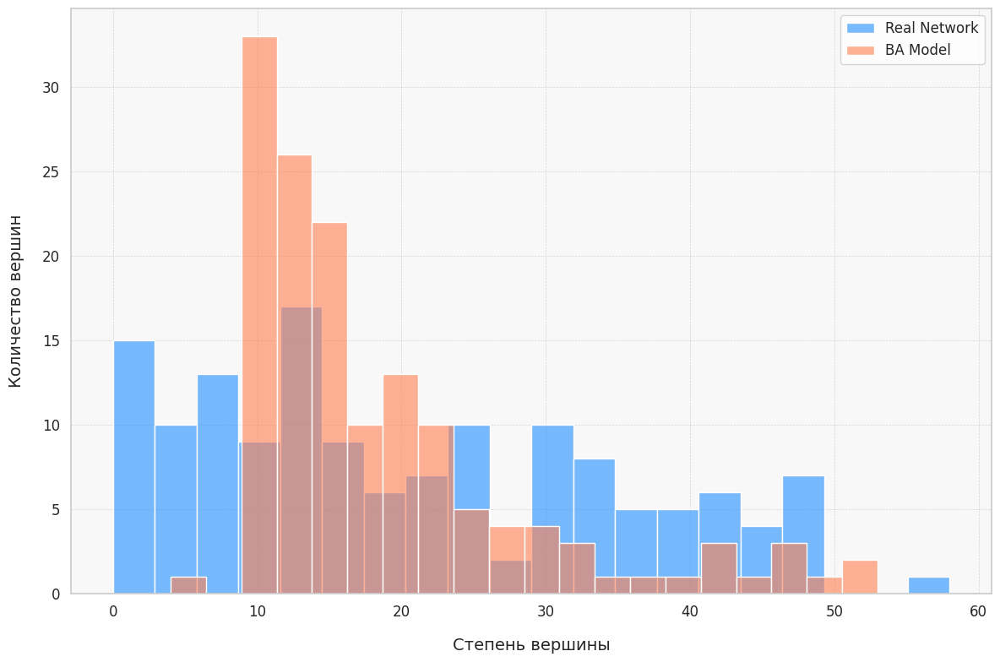

In [ ]:
def plot_degree_distribution(real_seq, model_seq, model_name, filename):
    plt.figure(figsize=(12, 8))
    sns.histplot(real_seq, bins=20, color="dodgerblue", alpha=0.6, label="Real Network", kde=False)
    sns.histplot(model_seq, bins=20, color="coral", alpha=0.6, label=model_name, kde=False)
    plt.grid(visible=True, which="major", color="gray", linestyle="--", linewidth=0.5, alpha=0.3)
    plt.gca().set_facecolor('#f8f8f8')
    plt.xlabel("Степень вершины", fontsize=14, labelpad=15)
    plt.ylabel("Количество вершин", fontsize=14, labelpad=15)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(fontsize=12)
    plt.tight_layout()
    plt.savefig(filename, dpi=300)
    plt.show()


plot_degree_distribution(degree_sequence, ba_degree_sequence, "BA Model", "degree_distribution_real_vs_ba.png")

#### Degree/Closeness/Betweenness centralities



In [ ]:
G.remove_nodes_from(isolated_nodes)

/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py:457: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


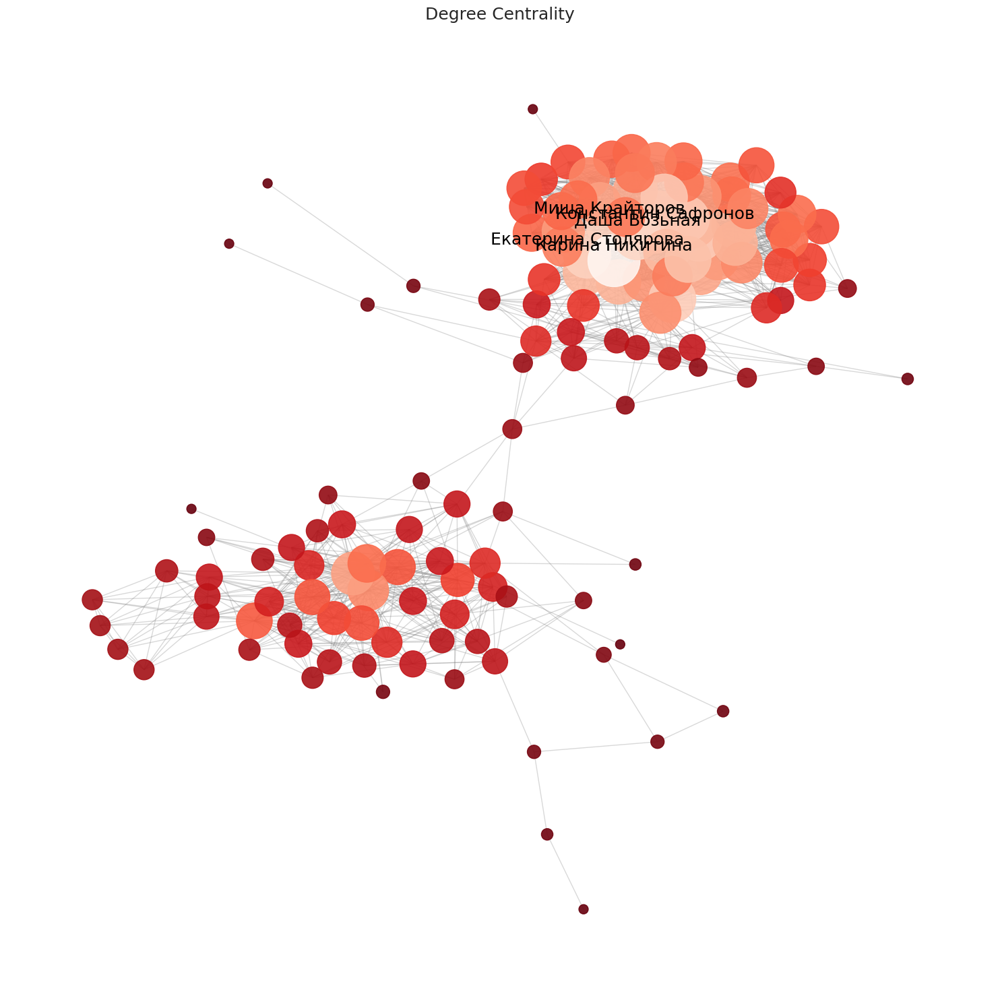

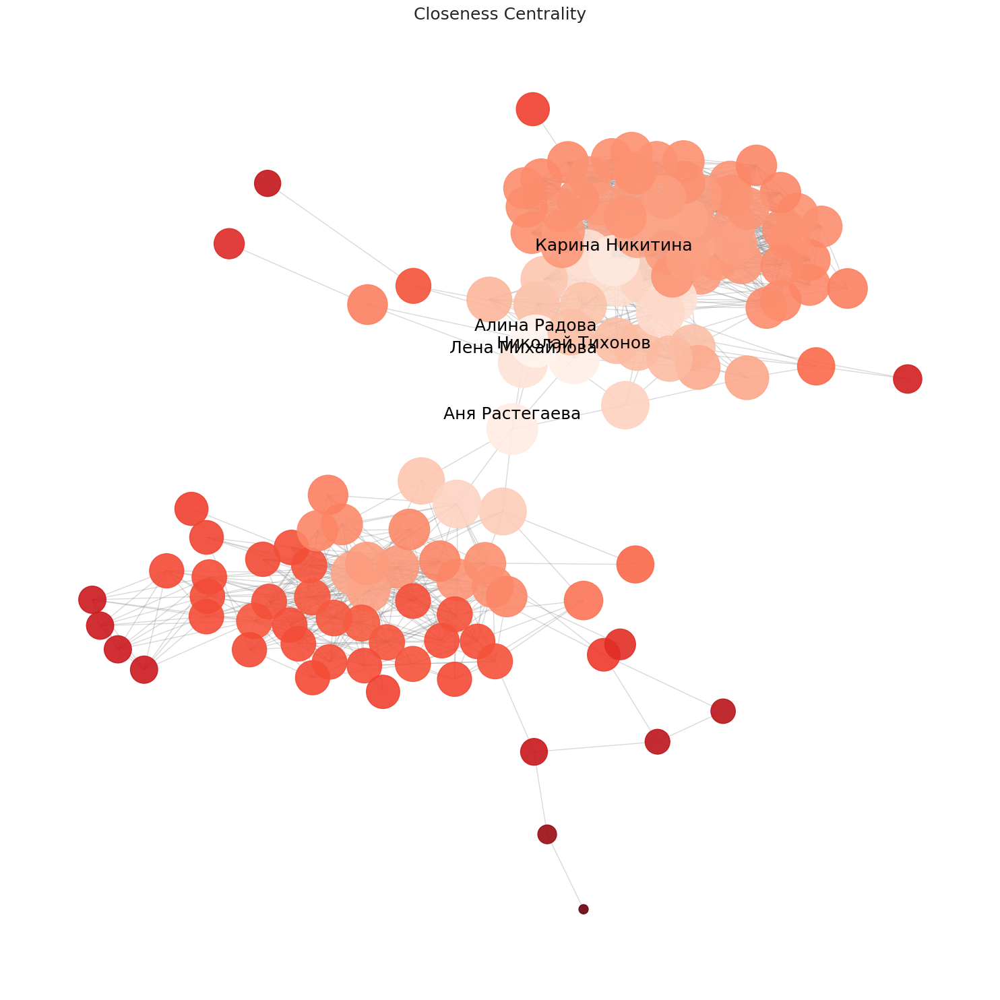

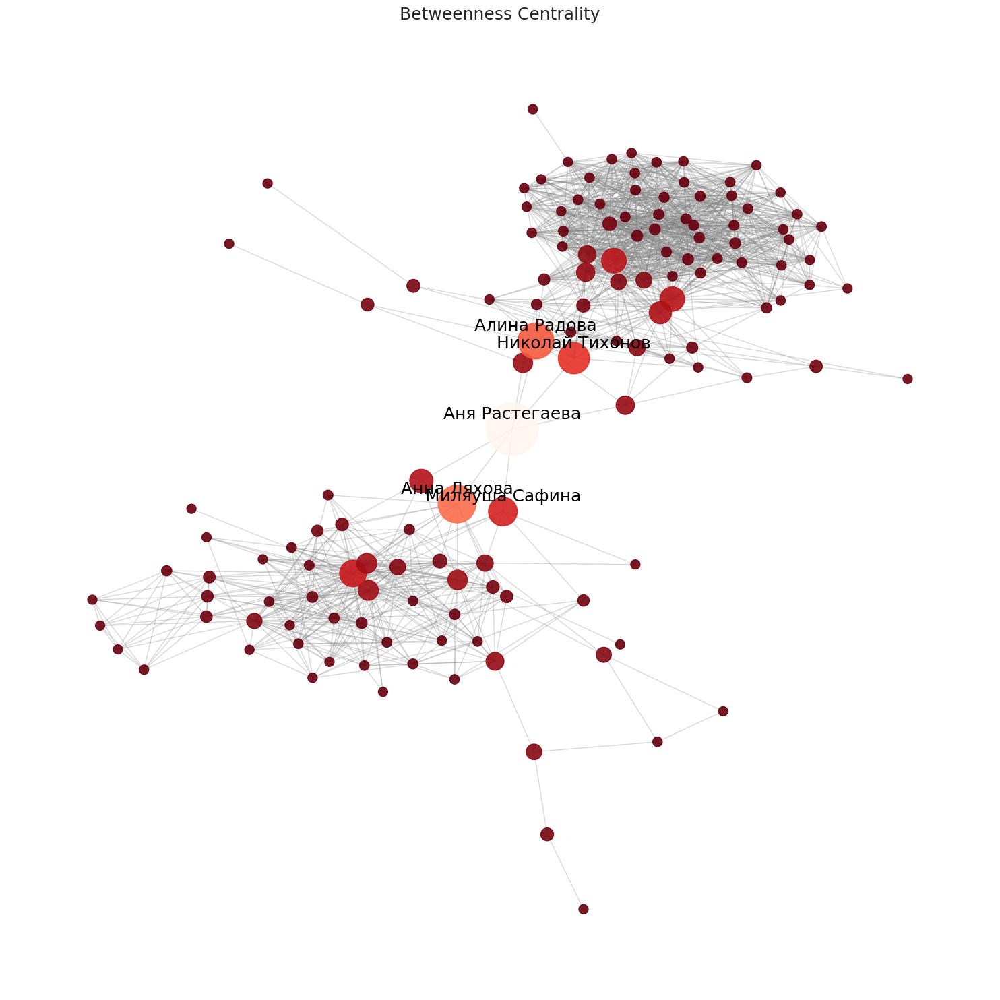

In [ ]:
degree_centrality = nx.degree_centrality(G)
closeness_centrality = nx.closeness_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)

def visualize_centrality_kamada_red_white_scale(graph, centrality, title):
    centrality_values = np.array(list(centrality.values()))
    node_sizes = 100 + (centrality_values - centrality_values.min()) / (centrality_values.max() - centrality_values.min()) * 3000
    node_colors = sns.color_palette("Reds", as_cmap=True)(
        1 - (centrality_values - centrality_values.min()) / (centrality_values.max() - centrality_values.min()))

    top_5_nodes = sorted(centrality.items(), key=lambda x: x[1], reverse=True)[:5]
    top_5_labels = {
        node: f"{graph.nodes[node].get('name', 'Name')} {graph.nodes[node].get('surname', 'Surname')}"
        for node, _ in top_5_nodes
    }

    plt.figure(figsize=(15, 15))
    pos = nx.kamada_kawai_layout(graph)
    nx.draw_networkx_edges(graph, pos, alpha=0.3, edge_color="gray")
    nx.draw_networkx_nodes(graph, pos, node_color=node_colors, node_size=node_sizes, cmap="Reds", alpha=0.9)

    for node, label in top_5_labels.items():
        x, y = pos[node]
        plt.text(x, y + 0.02, label, fontsize=18, ha="center", color="black")

    plt.title(title, fontsize=18)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

visualize_centrality_kamada_red_white_scale(G, degree_centrality, "Degree Centrality")
visualize_centrality_kamada_red_white_scale(G, closeness_centrality, "Closeness Centrality")
visualize_centrality_kamada_red_white_scale(G, betweenness_centrality, "Betweenness Centrality")


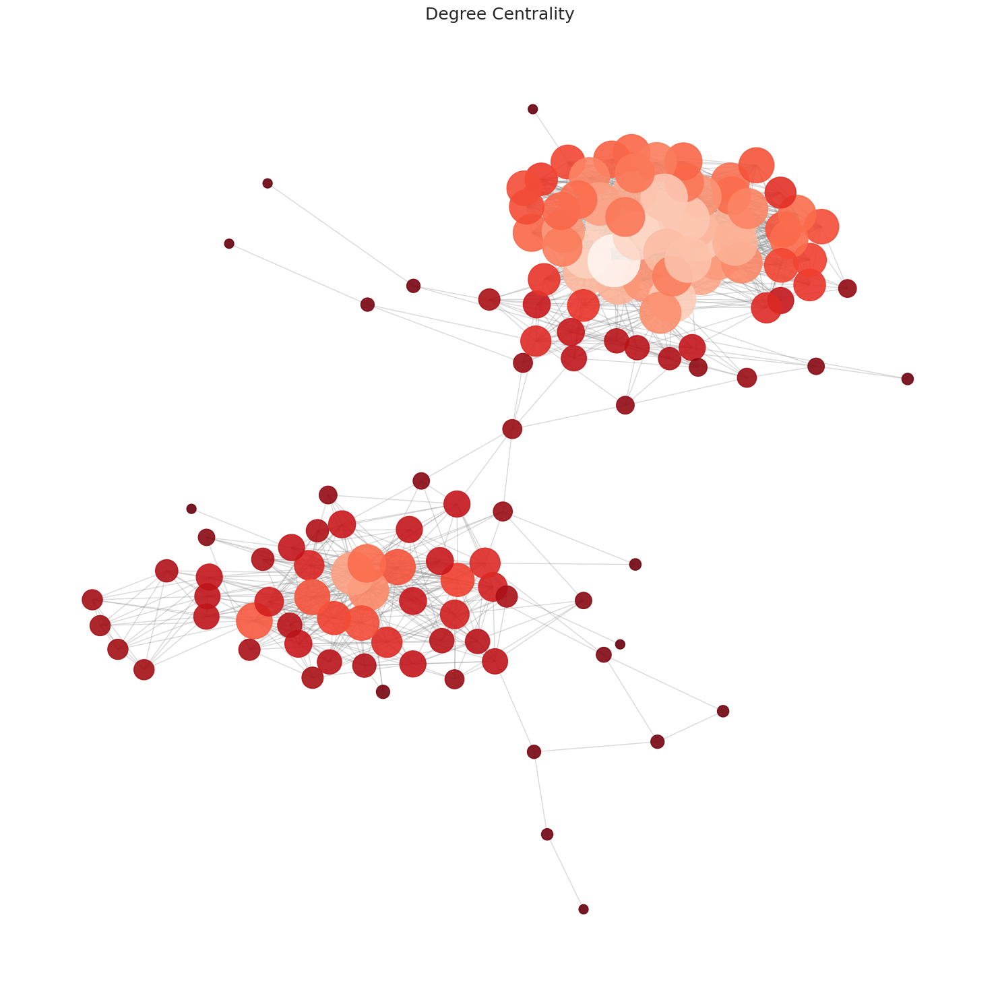

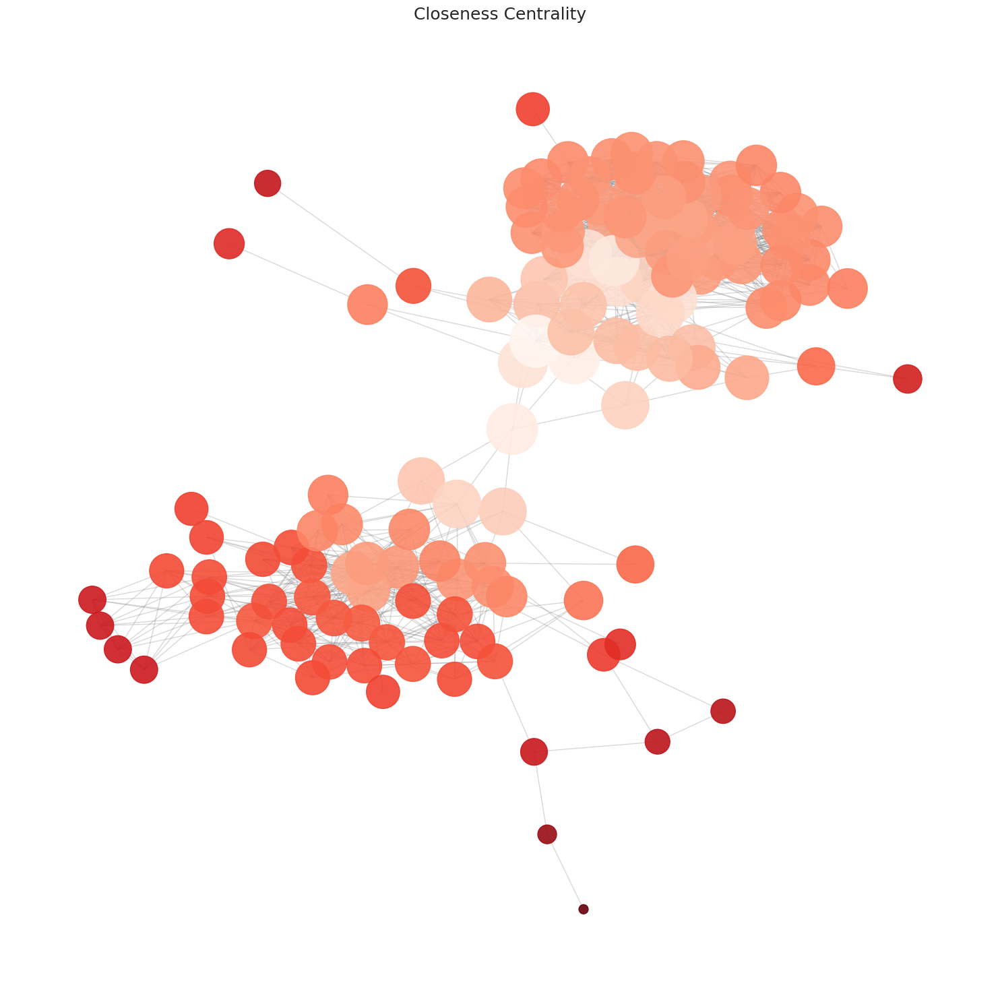

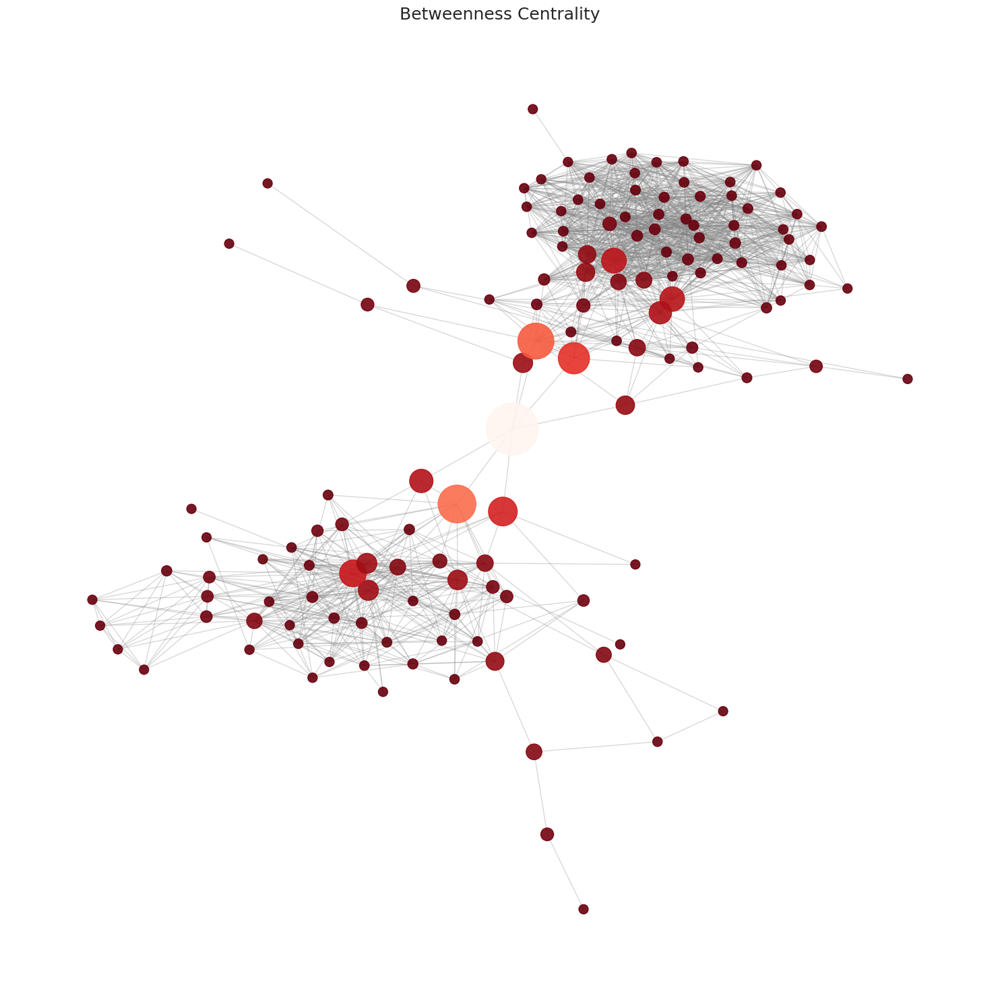

In [ ]:
# Функция для визуализации графа  без подписей
def visualize_centrality_kamada_red_white_no_labels(graph, centrality, title, filename):
    centrality_values = np.array(list(centrality.values()))
    node_sizes = 100 + (centrality_values - centrality_values.min()) / (centrality_values.max() - centrality_values.min()) * 3000
    node_colors = sns.color_palette("Reds", as_cmap=True)(
        1 - (centrality_values - centrality_values.min()) / (centrality_values.max() - centrality_values.min()))

    plt.figure(figsize=(15, 15))
    pos = nx.kamada_kawai_layout(graph)
    nx.draw_networkx_edges(graph, pos, alpha=0.3, edge_color="gray")
    nx.draw_networkx_nodes(graph, pos, node_color=node_colors, node_size=node_sizes, cmap="Reds", alpha=0.9)

    plt.title(title, fontsize=18)
    plt.axis("off")
    plt.tight_layout()

    plt.savefig(filename, dpi=300)
    plt.show()

visualize_centrality_kamada_red_white_no_labels(G, degree_centrality, "Degree Centrality", "degree_no_labels.png")
visualize_centrality_kamada_red_white_no_labels(G, closeness_centrality, "Closeness Centrality", "closeness_no_labels.png")
visualize_centrality_kamada_red_white_no_labels(G, betweenness_centrality, "Betweenness Centrality", "betweenness_no_labels.png")


In [ ]:
def get_top_3_centrality(centrality, graph, centrality_name):
    top_3_nodes = sorted(centrality.items(), key=lambda x: x[1], reverse=True)[:3]
    data = []
    for node, value in top_3_nodes:
        name = graph.nodes[node].get('name', 'Name')
        surname = graph.nodes[node].get('surname', 'Surname')
        data.append({"Name": name, "Surname": surname, centrality_name: value})
    return pd.DataFrame(data)

degree_top_3 = get_top_3_centrality(degree_centrality, G, "Degree Centrality")
closeness_top_3 = get_top_3_centrality(closeness_centrality, G, "Closeness Centrality")
betweenness_top_3 = get_top_3_centrality(betweenness_centrality, G, "Betweenness Centrality")
degree_top_3

,Name,Surname,Degree Centrality
0,Карина,Никитина,0.420290
1,Константин,Сафронов,0.355072
2,Даша,Возьная,0.355072


In [ ]:
closeness_top_3

,Name,Surname,Closeness Centrality
0,Алина,Радова,0.373984
1,Николай,Тихонов,0.366048
2,Аня,Растегаева,0.362205


In [ ]:
betweenness_top_3

,Name,Surname,Betweenness Centrality
0,Аня,Растегаева,0.491108
1,Анна,Ляхова,0.250690
2,Алина,Радова,0.225836


#### Page-Rank.

In [ ]:
def get_node_labels(graph):
    return {
        node: f"{graph.nodes[node].get('name', 'Name')} {graph.nodes[node].get('surname', 'Surname')}"
        for node in graph.nodes()
    }

In [ ]:
def page_rank(G, alpha, k):
    A = nx.to_numpy_array(G)
    P = transition_matrix(A)
    v = teleportation_vector(A)
    rank = np.ones(A.shape[0]) / A.shape[0]
    for _ in range(k):
        rank = update_rank(rank, P, v, alpha)
    return rank / rank.sum()

In [ ]:
def transition_matrix(A):
    sumA = A.sum(axis=1)
    sumA[sumA == 0] = 1
    return A / sumA[:, None]

def teleportation_vector(A):
    return np.ones(A.shape[0]) / A.shape[0]

def update_rank(rank, P, v, alpha):
    return alpha * P.T @ rank + (1 - alpha) * v

/usr/local/lib/python3.10/dist-packages/networkx/drawing/nx_pylab.py:457: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


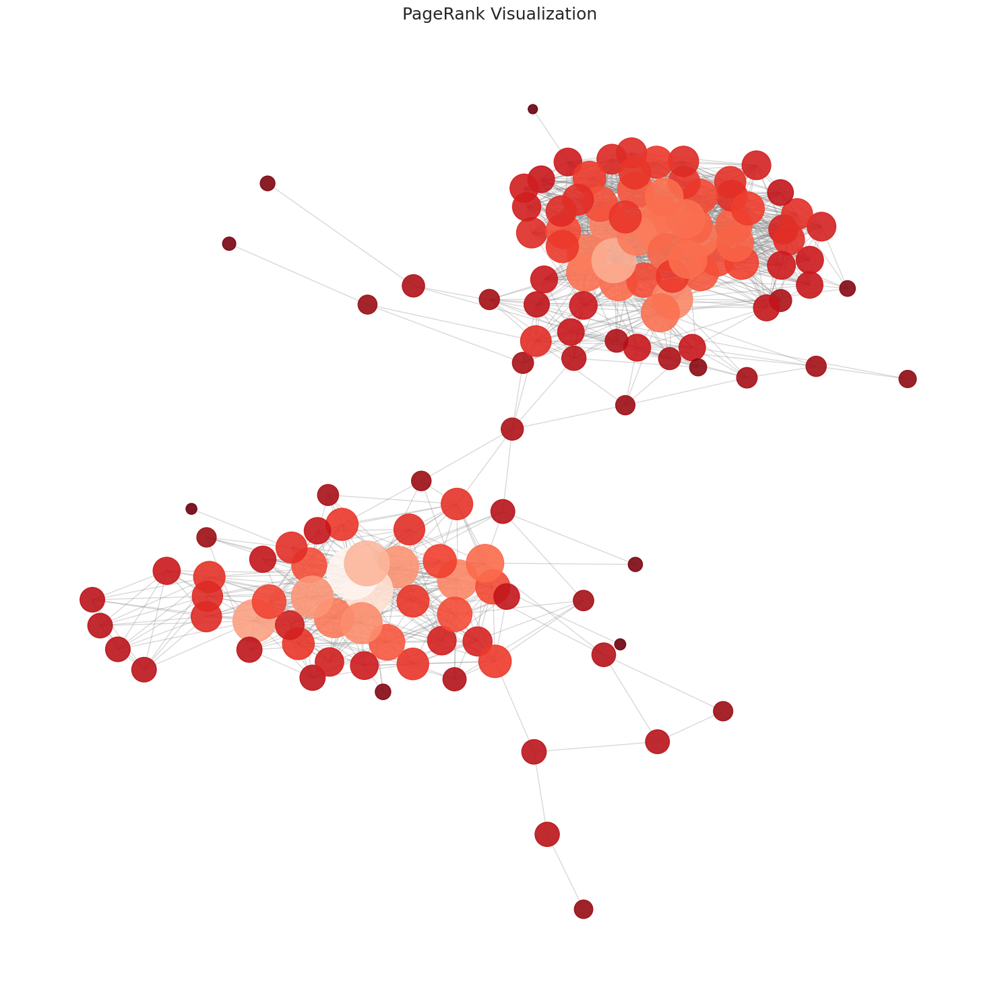

In [ ]:
def plot_pagerank_red_white_scale(с, pr, title, filename):
    pr_values = np.array(pr)
    node_sizes = 100 + (pr_values - pr_values.min()) / (pr_values.max() - pr_values.min()) * 3000
    node_colors = sns.color_palette("Reds", as_cmap=True)(
        1 - (pr_values - pr_values.min()) / (pr_values.max() - pr_values.min())
    )

    plt.figure(figsize=(15, 15))
    pos = nx.kamada_kawai_layout(G)

    nx.draw_networkx_edges(G, pos, alpha=0.3, edge_color="gray")

    nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes, cmap="Reds", alpha=0.9)

    plt.title(title, fontsize=18)
    plt.axis("off")
    plt.tight_layout()
    plt.savefig(filename, dpi=300)
    plt.show()

pr = page_rank(G, alpha=0.9, k=100)
plot_pagerank_red_white_scale(G, pr, "PageRank Visualization", "pagerank_red_white_scale.png")

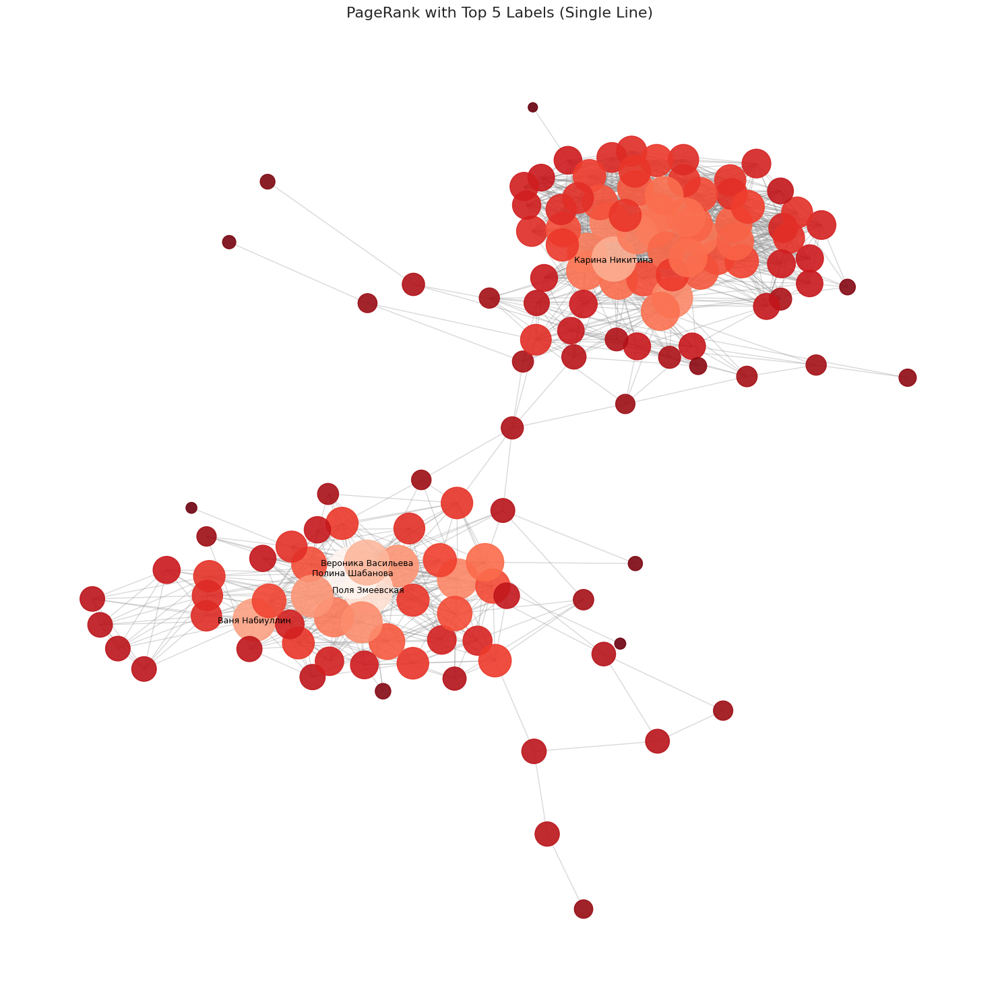

In [ ]:
node_labels = get_node_labels(G)
original_to_reindexed = {original: reindexed for reindexed, original in enumerate(G.nodes())}
reindexed_to_original = {v: k for k, v in original_to_reindexed.items()}

top_5 = sorted(enumerate(pr), key=lambda x: x[1], reverse=True)[:5]
top_5_labels = [
    {"Имя и Фамилия": node_labels[reindexed_to_original[node]], "PageRank": value}
    for node, value in top_5
]

def plot_pagerank_with_top_5_labels_single_line(G, pr, top_5, title, filename):
    pr_values = np.array(pr)
    node_sizes = 100 + (pr_values - pr_values.min()) / (pr_values.max() - pr_values.min()) * 3000
    node_colors = sns.color_palette("Reds", as_cmap=True)(
        1 - (pr_values - pr_values.min()) / (pr_values.max() - pr_values.min())
    )

    plt.figure(figsize=(15, 15))
    pos = nx.kamada_kawai_layout(G)

    nx.draw_networkx_edges(G, pos, alpha=0.3, edge_color="gray")
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes, cmap="Reds", alpha=0.9)

    for node, _ in top_5:
        original_node = reindexed_to_original[node]
        x, y = pos[original_node]
        label = node_labels[original_node]
        plt.text(x, y - 0.007, label, fontsize=9, ha="center", color="black")

    plt.title(title, fontsize=16)
    plt.axis("off")
    plt.tight_layout()
    plt.savefig(filename, dpi=300)
    plt.show()

plot_pagerank_with_top_5_labels_single_line(G, pr, top_5, "PageRank with Top 5 Labels (Single Line)", "pagerank_with_top_5_labels_single_line.png")

In [ ]:
top_5_labels

[{'Имя и Фамилия': 'Полина Шабанова', 'PageRank': 0.020415333705162197},
 {'Имя и Фамилия': 'Поля Змеевская', 'PageRank': 0.01790931656104014},
 {'Имя и Фамилия': 'Вероника Васильева', 'PageRank': 0.015315654274943491},
 {'Имя и Фамилия': 'Карина Никитина', 'PageRank': 0.014778636151537095},
 {'Имя и Фамилия': 'Ваня Набиуллин', 'PageRank': 0.013958301131567034}]

#### Correlation comparison of centralities and prestige. Сравнение топ-вершин.

In [ ]:
def pearson_correlation(i_vals: np.array, j_vals: np.array) -> float:
    """
    Calculate Pearson correlation coefficient

    :param i_vals: array of centralities
    :param j_vals: array of centralities
    :return: Pearson's correlation
    """
    return np.corrcoef(i_vals, j_vals)[0, 1]

In [ ]:
degree_centrality = list(nx.degree_centrality(G).values())
closeness_centrality = list(nx.closeness_centrality(G).values())
betweenness_centrality = list(nx.betweenness_centrality(G).values())
pr_values = page_rank(G, alpha=0.9, k=100)

In [ ]:
centvals = [
    ('Degree', degree_centrality),
    ('Closeness', closeness_centrality),
    ('Betweenness', betweenness_centrality),
    ('PageRank', pr_values)
]

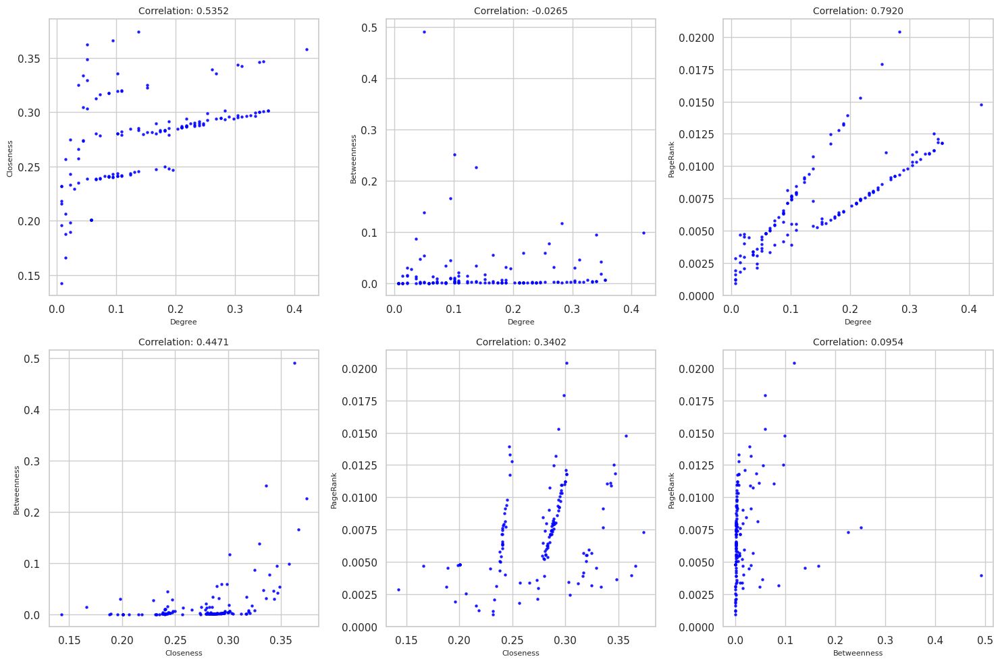

In [ ]:
plt.figure(figsize=(15, 10))
plt.subplots_adjust(hspace=0.4, wspace=0.4)
k = 1
for i in range(len(centvals)):
    for j in range(i + 1, len(centvals)):
        i_label, i_vals = centvals[i]
        j_label, j_vals = centvals[j]
        correlation = pearson_correlation(i_vals, j_vals)
        plt.subplot(2, 3, k)
        plt.scatter(i_vals, j_vals, s=5, alpha=0.8, color='blue')
        plt.title(f'Correlation: {correlation:.4f}', fontsize=10)
        plt.xlabel(i_label, fontsize=8)
        plt.ylabel(j_label, fontsize=8)
        k += 1

plt.tight_layout()
plt.savefig("centrality_correlation_3x2.png", dpi=300)
plt.show()

In [ ]:
correlation_data = {
    i_label: [pearson_correlation(i_vals, j_vals) if i_label != j_label else 1.0
              for j_label, j_vals in centvals]
    for i_label, i_vals in centvals
}
correlation_df = pd.DataFrame(correlation_data, index=[label for label, _ in centvals])
correlation_df


,Degree,Closeness,Betweenness,PageRank
Degree,1.000000,0.535185,-0.026507,0.792007
Closeness,0.535185,1.000000,0.447083,0.340207
Betweenness,-0.026507,0.447083,1.000000,0.095376
PageRank,0.792007,0.340207,0.095376,1.000000


#### Assortative Mixing в соответствии с атрибутами вершин (пол, город)

In [ ]:
def attribute_mixing_matrix(G, attribute, mapping):
    matrix_size = len(mapping)
    mixing_matrix = np.zeros((matrix_size, matrix_size))
    for u, v in G.edges():
        if (
            attribute in G.nodes[u]
            and attribute in G.nodes[v]
            and G.nodes[u][attribute] != "N/A"
            and G.nodes[v][attribute] != "N/A"
        ):
            attr_u = G.nodes[u][attribute]
            attr_v = G.nodes[v][attribute]
            i, j = mapping[attr_u], mapping[attr_v]
            mixing_matrix[i, j] += 1
            mixing_matrix[j, i] += 1

    mixing_matrix /= mixing_matrix.sum()
    return mixing_matrix

In [ ]:
def assortativity_coef(mixing):
    trace_E = np.trace(mixing)
    E_squared = np.dot(mixing, mixing)
    sum_E2 = E_squared.sum()
    sum_E = mixing.sum()
    r = (trace_E - sum_E2) / (sum_E - sum_E2)
    return r

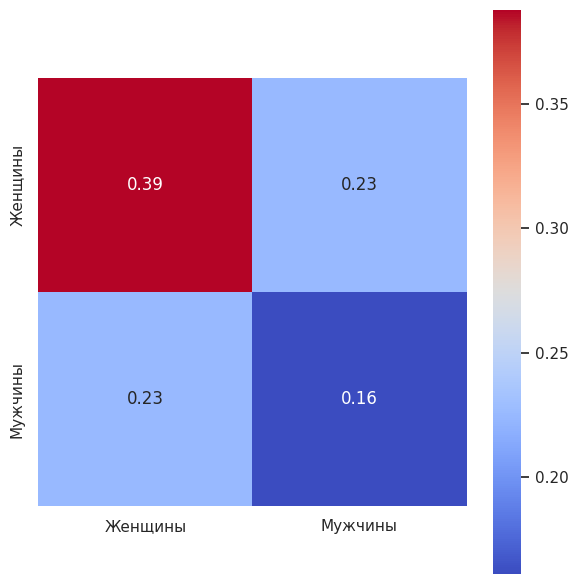

Коэффициент ассортативности (Пол): 0.0488


In [ ]:
gender_mapping = {1: "Женщины", 2: "Мужчины"}  # Replace numbers with descriptive labels
gender_values = np.unique([G.nodes[n]["sex"] for n in G.nodes])
mapping = {val: i for i, val in enumerate(gender_values)}
mixing = attribute_mixing_matrix(G, "sex", mapping)
assortativity = assortativity_coef(mixing)

plt.figure(figsize=(6, 6))
sns.heatmap(
    mixing,
    cbar=True,
    square=True,
    annot=True,
    fmt=".2f",
    xticklabels=[gender_mapping[val] for val in gender_values],
    yticklabels=[gender_mapping[val] for val in gender_values],
    cmap="coolwarm"
)
plt.tight_layout()
plt.savefig("assortative_mixing_gender_named.png", dpi=300)
plt.show()

print(f"Коэффициент ассортативности (Пол): {assortativity:.4f}")

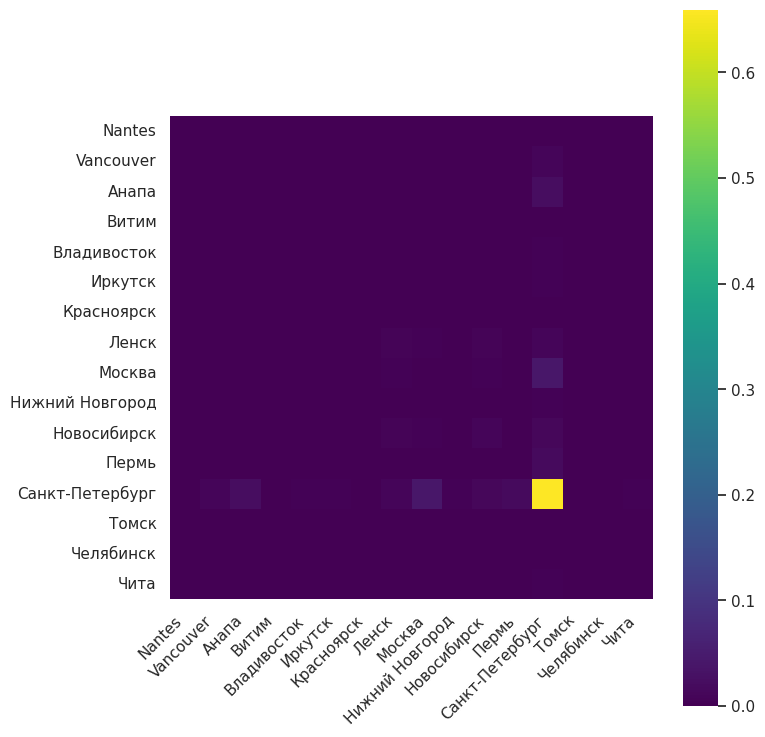

Коэффициент ассортативности (Город): 0.1283


In [ ]:
city_values = [
    G.nodes[n]["city"] for n in G.nodes
    if "city" in G.nodes[n] and G.nodes[n]["city"] != "N/A"
]
unique_cities = np.unique(city_values)
mapping_city = {val: i for i, val in enumerate(unique_cities)}

mixing_city = attribute_mixing_matrix(G, "city", mapping_city)

plt.figure(figsize=(8, 8))
sns.heatmap(
    mixing_city,
    cbar=True,
    square=True,
    annot=False,
    fmt=".2f",
    xticklabels=[city for city in unique_cities],
    yticklabels=[city for city in unique_cities],
    cmap="viridis"
)
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.savefig("assortative_mixing_city_cleaned.png", dpi=300)
plt.show()

assortativity_city = assortativity_coef(mixing_city)
print(f"Коэффициент ассортативности (Город): {assortativity_city:.4f}")


#### Node structural equivalence/similarity

In [ ]:
def sim_values(A, i, j):
    Ai, Aj = A[i], A[j]
    pval = corrcoef(Ai, Aj)[0, 1]
    jval = np.sum(np.logical_and(Ai, Aj)) / np.sum(np.logical_or(Ai, Aj))
    cval = 1 - cosine(Ai, Aj)
    return pval, jval, cval

In [ ]:
A = nx.to_numpy_array(G)
n = len(G)

cos_sim = np.zeros(A.shape)
pearson_sim = np.zeros(A.shape)
jaccard_sim = np.zeros(A.shape)

In [ ]:
for i in range(n):
    for j in range(i, n):
        pval, jval, cval = sim_values(A, i, j)
        pearson_sim[i, j] = pval
        pearson_sim[j, i] = pval
        jaccard_sim[i, j] = jval
        jaccard_sim[j, i] = jval
        cos_sim[i, j] = cval
        cos_sim[j, i] = cval


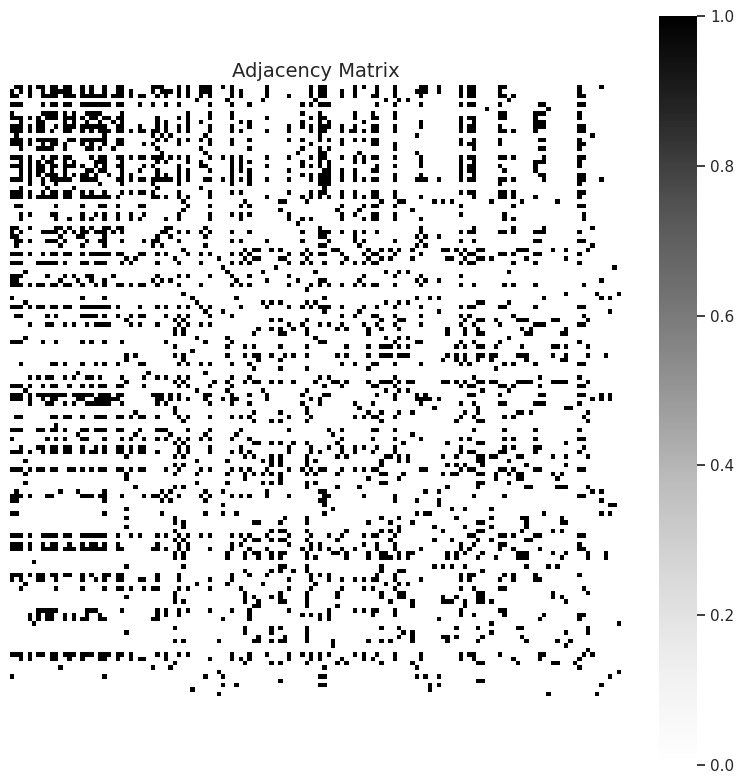

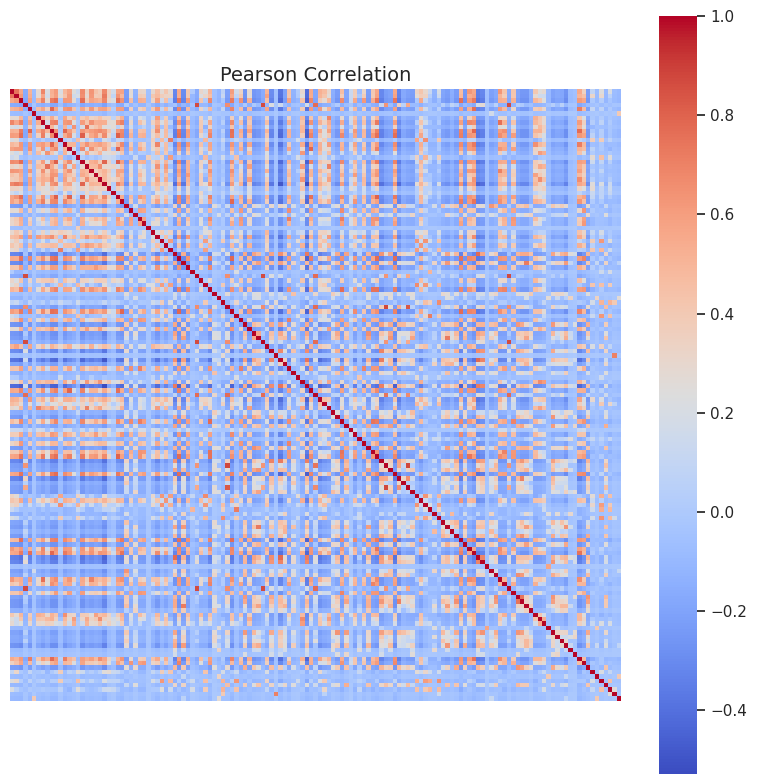

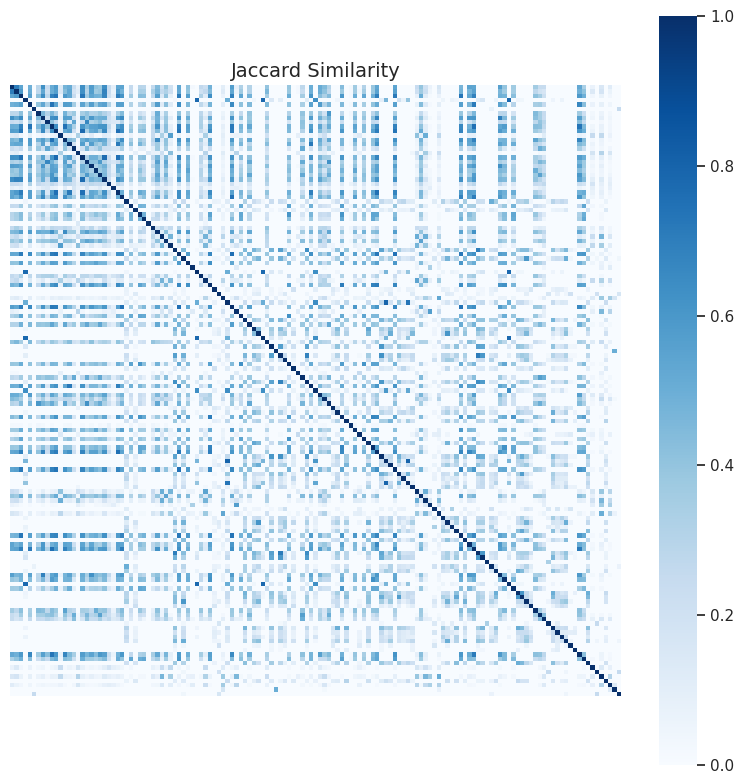

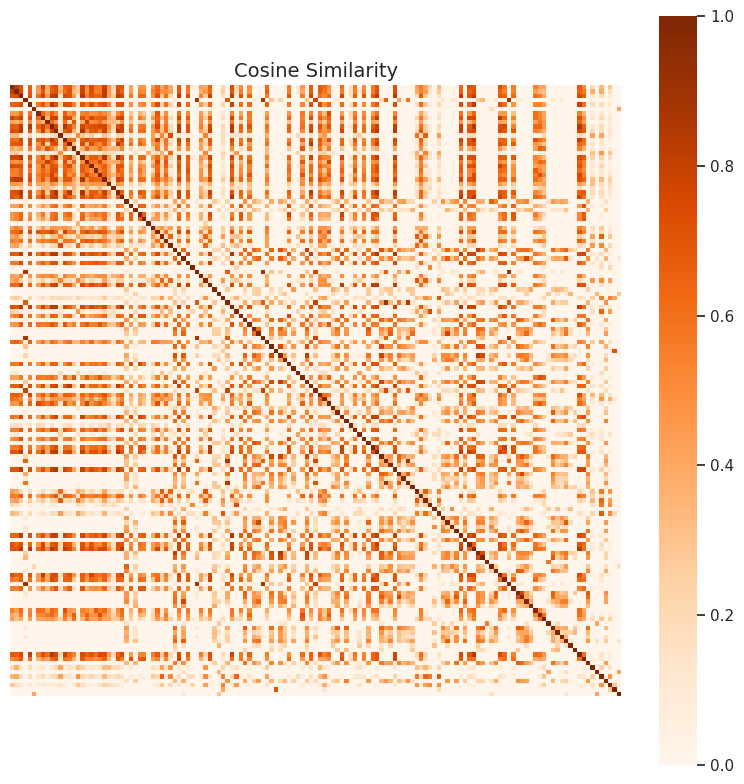

In [ ]:
cases = [
    [A, plt.cm.Greys, 'Adjacency Matrix', "adjacency_matrix.png"],
    [pearson_sim, "coolwarm", 'Pearson Correlation', "pearson_correlation.png"],
    [jaccard_sim, "Blues", 'Jaccard Similarity', "jaccard_similarity.png"],
    [cos_sim, "Oranges", 'Cosine Similarity', "cosine_similarity.png"],
]

for matrix, cmap, title, filename in cases:
    plt.figure(figsize=(8, 8))
    sns.heatmap(
        matrix,
        cmap=cmap,
        square=True,
        cbar=True,
        xticklabels=False,
        yticklabels=False
    )
    plt.title(title, fontsize=14)
    plt.tight_layout()
    plt.savefig(filename, dpi=300)
    plt.show()
    plt.close()

In [ ]:
similarity_matrix = cos_sim
all_pairs = [
    (i, j, similarity_matrix[i, j])
    for i in range(n)
    for j in range(i + 1, n)
]

sorted_pairs = sorted(all_pairs, key=lambda x: x[2], reverse=True)

top_n = 10
top_n_pairs = sorted_pairs[:top_n]
node_labels = get_node_labels(G)

original_to_reindexed = {original: reindexed for reindexed, original in enumerate(G.nodes())}
reindexed_to_original = {reindexed: original for original, reindexed in original_to_reindexed.items()}

top_n_pairs_with_names_fixed = [
    {
        "Узел 1": node_labels[reindexed_to_original[i]],
        "Узел 2": node_labels[reindexed_to_original[j]],
        "Сходство": sim
    }
    for i, j, sim in top_n_pairs
]

top_n_pairs_with_names_fixed

[{'Узел 1': 'Никита Артемьев',
  'Узел 2': 'Илья Пешкин',
  'Сходство': 0.8894991799933214},
 {'Узел 1': 'Илья Пешкин',
  'Узел 2': 'Иван Башманов',
  'Сходство': 0.8894991799933214},
 {'Узел 1': 'Dimitri Teslev', 'Узел 2': 'Савва Якимов', 'Сходство': 0.875},
 {'Узел 1': 'Dimitri Teslev', 'Узел 2': 'Никита Мельников', 'Сходство': 0.875},
 {'Узел 1': 'Dimitri Teslev', 'Узел 2': 'Егор Чередников', 'Сходство': 0.875},
 {'Узел 1': 'Миша Крайторов',
  'Узел 2': 'Екатерина Столярова',
  'Сходство': 0.875},
 {'Узел 1': 'Савва Якимов', 'Узел 2': 'Никита Мельников', 'Сходство': 0.875},
 {'Узел 1': 'Савва Якимов', 'Узел 2': 'Егор Чередников', 'Сходство': 0.875},
 {'Узел 1': 'Никита Мельников',
  'Узел 2': 'Егор Чередников',
  'Сходство': 0.875},
 {'Узел 1': 'Екатерина Столярова',
  'Узел 2': 'Карина Никитина',
  'Сходство': 0.8718127501157389}]

Строю тепловую карту самых высоких значений похожести так, чтобы она включала определенное количество человека с самыми высокими значениями

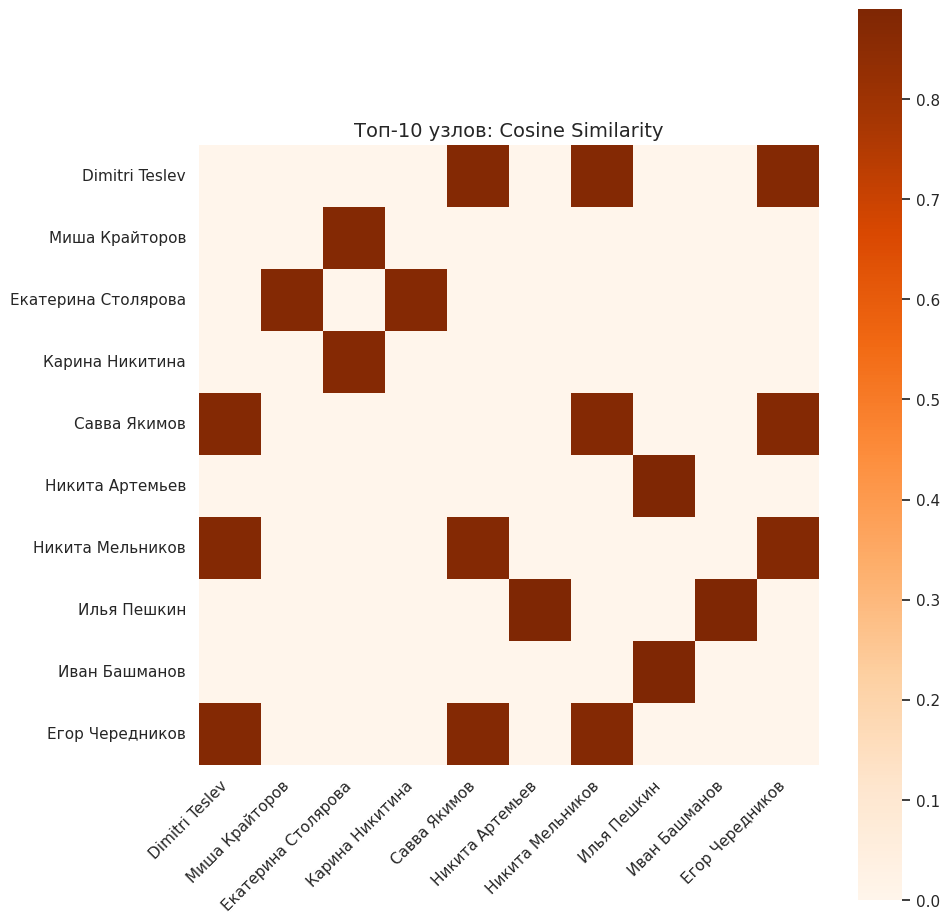

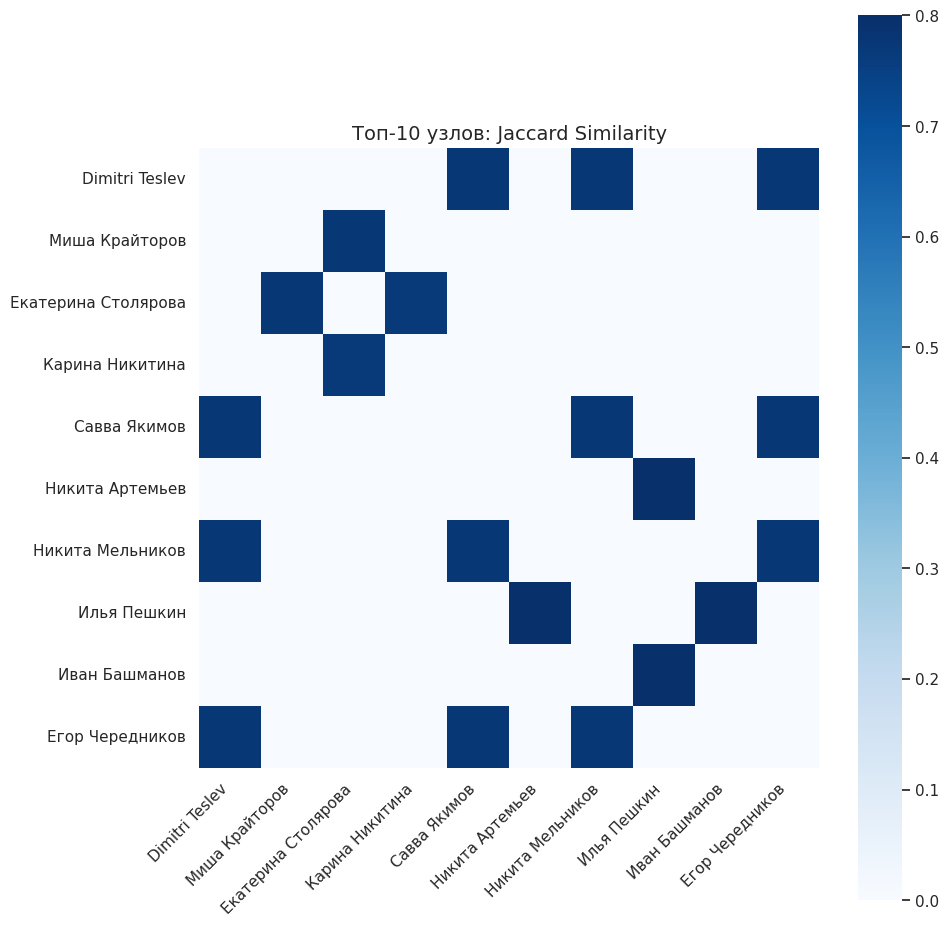

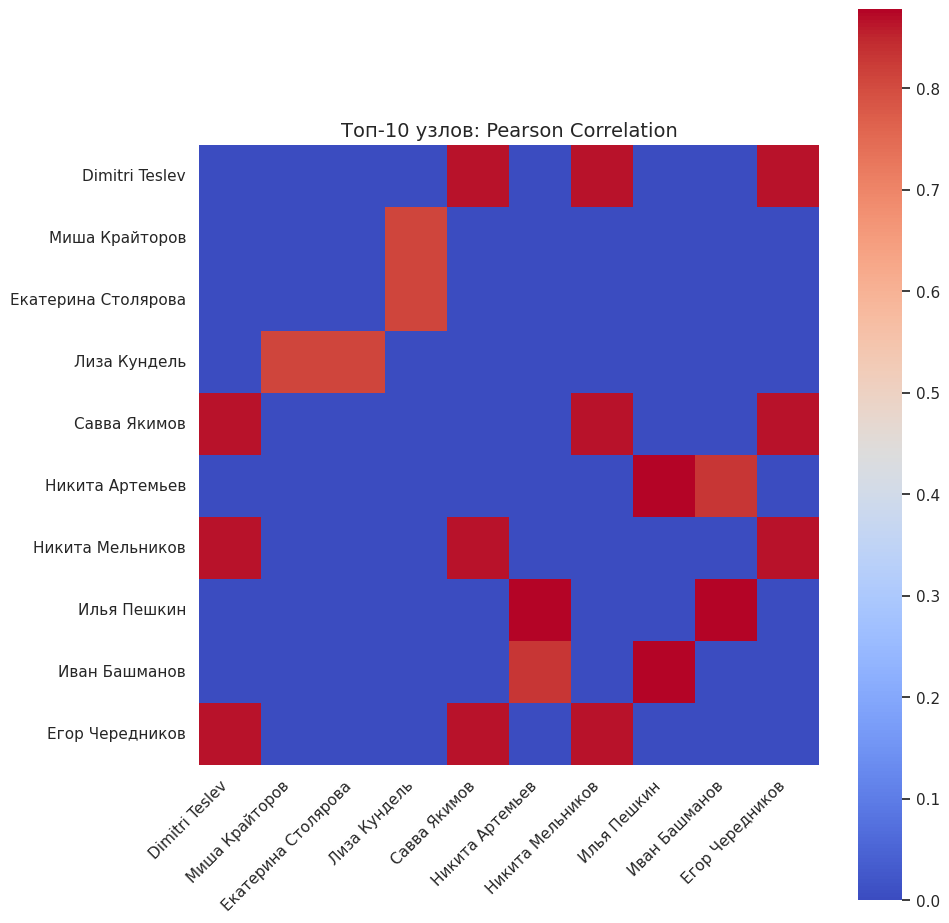

In [ ]:
def top_similar_nodes(similarity_matrix, node_labels, reindexed_to_original, top_person_count=30):
    all_pairs = [
        (i, j, similarity_matrix[i, j])
        for i in range(len(similarity_matrix))
        for j in range(i + 1, len(similarity_matrix))
    ]

    sorted_pairs = sorted(all_pairs, key=lambda x: x[2], reverse=True)
    top_nodes = set()
    selected_pairs = []
    for i, j, sim in sorted_pairs:
        if len(top_nodes) >= top_person_count:
            break
        top_nodes.update([i, j])
        selected_pairs.append((i, j, sim))
    top_nodes = list(top_nodes)
    top_nodes.sort()
    node_idx_map = {node: idx for idx, node in enumerate(top_nodes)}

    reduced_matrix = np.zeros((len(top_nodes), len(top_nodes)))
    for i, j, sim in selected_pairs:
        reduced_matrix[node_idx_map[i], node_idx_map[j]] = sim
        reduced_matrix[node_idx_map[j], node_idx_map[i]] = sim

    top_node_labels = {node_idx_map[node]: node_labels[reindexed_to_original[node]] for node in top_nodes}
    return reduced_matrix, top_node_labels

cosine_matrix, cosine_labels = top_similar_nodes(cos_sim, node_labels, reindexed_to_original, top_person_count=10)
plt.figure(figsize=(10, 10))
sns.heatmap(
    cosine_matrix,
    cmap="Oranges",
    square=True,
    xticklabels=[cosine_labels.get(i, "") for i in range(len(cosine_matrix))],
    yticklabels=[cosine_labels.get(i, "") for i in range(len(cosine_matrix))])
plt.xticks(rotation=45, ha="right")
plt.title("Топ-10 узлов: Cosine Similarity", fontsize=14)
plt.tight_layout()
plt.savefig("top_10_cosine_similarity_heatmap.png", dpi=300)
plt.show()

jaccard_matrix, jaccard_labels = top_similar_nodes(jaccard_sim, node_labels, reindexed_to_original, top_person_count=10)
plt.figure(figsize=(10, 10))
sns.heatmap(
    jaccard_matrix,
    cmap="Blues",
    square=True,
    xticklabels=[jaccard_labels.get(i, "") for i in range(len(jaccard_matrix))],
    yticklabels=[jaccard_labels.get(i, "") for i in range(len(jaccard_matrix))])
plt.xticks(rotation=45, ha="right")
plt.title("Топ-10 узлов: Jaccard Similarity", fontsize=14)
plt.tight_layout()
plt.savefig("top_10_jaccard_similarity_heatmap.png", dpi=300)
plt.show()

pearson_matrix, pearson_labels = top_similar_nodes(pearson_sim, node_labels, reindexed_to_original, top_person_count=10)
plt.figure(figsize=(10, 10))
sns.heatmap(
    pearson_matrix,
    cmap="coolwarm",
    square=True,
    xticklabels=[pearson_labels.get(i, "") for i in range(len(pearson_matrix))],
    yticklabels=[pearson_labels.get(i, "") for i in range(len(pearson_matrix))])
plt.xticks(rotation=45, ha="right")
plt.title("Топ-10 узлов: Pearson Correlation", fontsize=14)
plt.tight_layout()
plt.savefig("top_10_pearson_similarity_heatmap.png", dpi=300)
plt.show()

## Community Detection

#### Clique search

In [ ]:
def largest_cliques(G):
    cliques = list(nx.find_cliques(G))
    max_clique_size = max(len(clique) for clique in cliques)
    largest_cliques = [clique for clique in cliques if len(clique) == max_clique_size]

    n = len(largest_cliques)
    m = G.number_of_nodes()
    k = G.number_of_edges()

    colors = np.ones((n, m, 3))
    widths = np.full((n, k), 0.5)

    node_list = list(G.nodes())
    edge_list = list(G.edges())

    for i, clique in enumerate(largest_cliques):
        for node in clique:
            node_idx = node_list.index(node)
            colors[i, node_idx] = [0.2, 0.6, 1]

        for u in clique:
            for v in clique:
                if u != v and G.has_edge(u, v):
                    edge_idx = edge_list.index((u, v)) if (u, v) in edge_list else edge_list.index((v, u))
                    widths[i, edge_idx] = 3

    return colors, widths

In [ ]:
colors, widths = largest_cliques(G)
size = np.unique(colors[0], axis=0, return_counts=True)[1][0]
lespos = nx.kamada_kawai_layout(G)

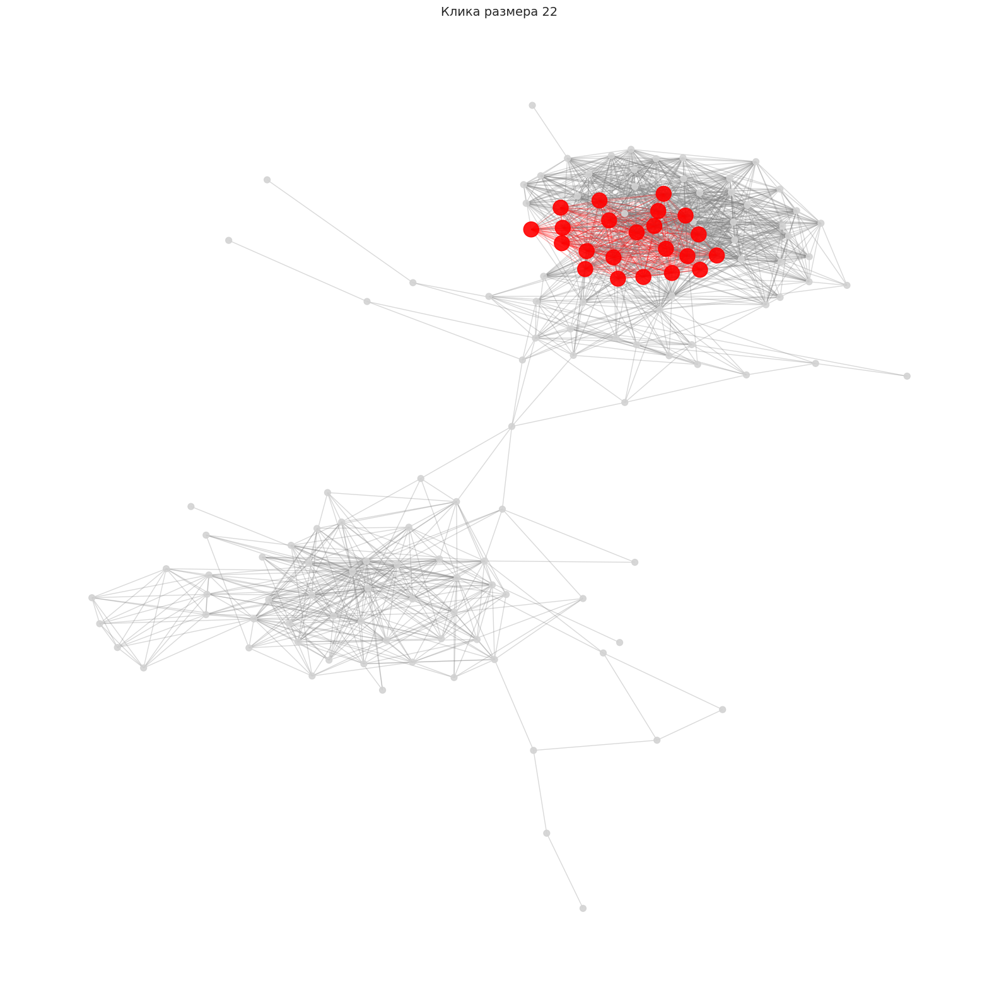

In [ ]:
def visualize_largest_cliques(graph):
    cliques = list(nx.find_cliques(graph))
    max_clique_size = max(len(clique) for clique in cliques)
    largest_cliques = [clique for clique in cliques if len(clique) == max_clique_size]

    pos = nx.kamada_kawai_layout(graph)

    plt.figure(figsize=(16, 16))

    for i, clique in enumerate(largest_cliques):
        node_colors = [
            "red" if node in clique else "lightgray" for node in graph.nodes()
        ]
        edge_colors = [
            "red" if edge[0] in clique and edge[1] in clique else "gray"
            for edge in graph.edges()
        ]
        node_sizes = [
            300 if node in clique else 50 for node in graph.nodes()
        ]

        plt.subplot(1, len(largest_cliques), i + 1)
        nx.draw_networkx_edges(graph, pos, alpha=0.3, edge_color=edge_colors)
        nx.draw_networkx_nodes(
            graph,
            pos,
            node_color=node_colors,
            node_size=node_sizes,
            alpha=0.9
        )
        plt.title(f'Клика размера {max_clique_size}', fontsize=14)
        plt.axis("off")

    plt.tight_layout()
    plt.savefig("largest_cliques_styled.png", dpi=300)
    plt.show()

visualize_largest_cliques(G)

In [ ]:
def get_largest_cliques_members(graph):
    cliques = list(nx.find_cliques(graph))
    max_clique_size = max(len(clique) for clique in cliques)
    largest_cliques = [clique for clique in cliques if len(clique) == max_clique_size]

    node_labels = get_node_labels(graph)
    clique_members = [
        {"Клика": f"Клика {i + 1}", "Участники": ", ".join([node_labels[node] for node in clique])}
        for i, clique in enumerate(largest_cliques)
    ]

    return clique_members

clique_members = get_largest_cliques_members(G)
clique_members

[{'Клика': 'Клика 1',
  'Участники': 'Карина Никитина, Екатерина Столярова, Миша Крайторов, Константин Сафронов, Даша Возьная, Лиза Кундель, Ирина Колеватых, Илья Веденев, Артем Крутько, Ваня Матвеев, Александра Стрелкова, Валя Щастная, Nastya Merzhuk, Аня Чеботаева, Серафим Вольтский, Алёна Шматохина, Алена Лебакина, Дарья Тимофеева, Дмитрий Боровой, Виктор Тимаков, Георгий Матюшин, Mirra Paskal'}]

#### girvan_newman

In [ ]:
def remove_bridges(G):
    initial_components = nx.number_connected_components(G)

    while True:
        edge_betweenness = nx.edge_betweenness_centrality(G)
        max_betweenness = max(edge_betweenness.values())
        edges_to_remove = [edge for edge, betweenness in edge_betweenness.items() if betweenness == max_betweenness]
        if edges_to_remove:
            G.remove_edge(*edges_to_remove[0])
            new_components = nx.number_connected_components(G)
            if new_components > initial_components:
                break

In [ ]:
def girvan_newman(G, n):
    labels = np.zeros((n, len(G)), dtype=int)
    _G = G.copy()
    for division in range(n):
        remove_bridges(_G)
        for i, cc in enumerate(nx.connected_components(_G)):
            for node in cc:
                labels[division, node] = i
    return labels

In [ ]:
G_reindexed = nx.convert_node_labels_to_integers(G)
lespos = nx.kamada_kawai_layout(G_reindexed)
labels = girvan_newman(G_reindexed, 4)

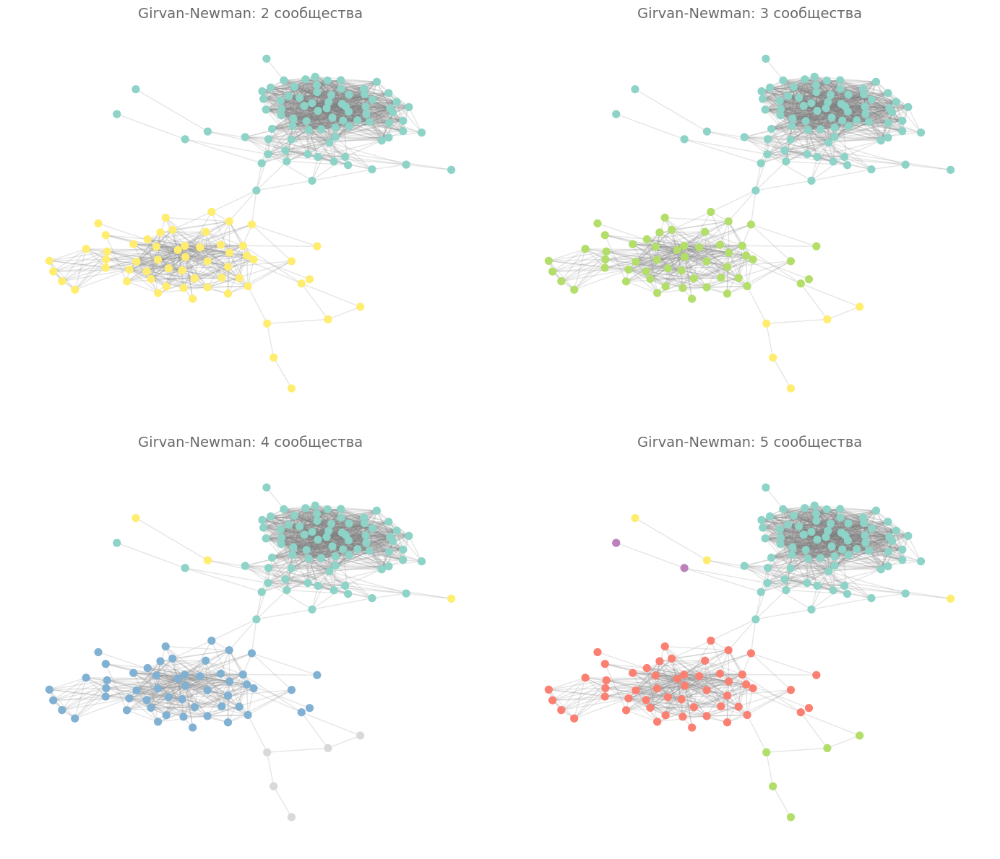

In [ ]:
plt.figure(figsize=(14, 18))

for i in range(labels.shape[0]):
    plt.subplot(3, 2, i + 1)
    # Узлы
    nx.draw_networkx_nodes(
        G_reindexed,
        lespos,
        node_color=labels[i],
        cmap=plt.cm.Set3,
        node_size=50,
        alpha=1
    )
    nx.draw_networkx_edges(
        G_reindexed,
        lespos,
        alpha=0.2,
        edge_color="gray"
    )
    plt.title(f'Girvan-Newman: {i + 2} сообщества', fontsize=14, color="dimgray")
    plt.axis("off")

plt.tight_layout()
plt.savefig("girvan_newman_palette.png", dpi=300)
plt.show()

In [ ]:
def get_communities_by_labels(graph, labels):
    communities = []
    node_labels = get_node_labels(graph)
    for division in range(labels.shape[0]):
        community_dict = {}
        for community_id in np.unique(labels[division]):
            community_nodes = [
                node_labels[node]
                for node in range(len(graph))
                if labels[division, node] == community_id
            ]
            community_dict[f"Сообщество {community_id + 1}"] = community_nodes
        communities.append(community_dict)
    return communities

communities = get_communities_by_labels(G_reindexed, labels)

community_tables = []
for division, community_dict in enumerate(communities, start=1):
    data = []
    for community, members in community_dict.items():
        data.append({"Сообщество": community, "Участники": ", ".join(members)})
    community_df = pd.DataFrame(data)
    community_tables.append((f"Сообщества, разделение {division}", community_df))
community_tables

[('Сообщества, разделение 1',
       Сообщество                                          Участники
  0  Сообщество 1  Алена Лебакина, Аня Чеботаева, Константин Сафр...
  1  Сообщество 2  Dimitri Teslev, Наталья Яковлева, Олег Федюков...),
 ('Сообщества, разделение 2',
       Сообщество                                          Участники
  0  Сообщество 1  Алена Лебакина, Аня Чеботаева, Константин Сафр...
  1  Сообщество 2  Dimitri Teslev, Олег Федюкович, Максим Вершини...
  2  Сообщество 3  Наталья Яковлева, Юля Акинфина, Никита Иванов,...),
 ('Сообщества, разделение 3',
       Сообщество                                          Участники
  0  Сообщество 1  Алена Лебакина, Аня Чеботаева, Константин Сафр...
  1  Сообщество 2  Dimitri Teslev, Олег Федюкович, Максим Вершини...
  2  Сообщество 3  Наталья Яковлева, Юля Акинфина, Никита Иванов,...
  3  Сообщество 4     Полина Еланская, Эмиль Валеев, Машуля Котунова),
 ('Сообщества, разделение 4',
       Сообщество                             

In [ ]:
community_df

,Сообщество,Участники
0,Сообщество 1,"Алена Лебакина, Аня Чеботаева, Константин Сафр..."
1,Сообщество 2,"Dimitri Teslev, Олег Федюкович, Максим Вершини..."
2,Сообщество 3,"Наталья Яковлева, Юля Акинфина, Никита Иванов,..."
3,Сообщество 4,"Мария Дровозюк, Лиза Зинченко"
4,Сообщество 5,"Полина Еланская, Эмиль Валеев, Машуля Котунова"


#### K-cores visualization

In [ ]:
def k_core_decompose(G):
    return np.array(list(nx.core_number(G).values()))

In [ ]:
lesG = nx.convert_node_labels_to_integers(G)
lespos = nx.kamada_kawai_layout(lesG)
labels = k_core_decompose(lesG)

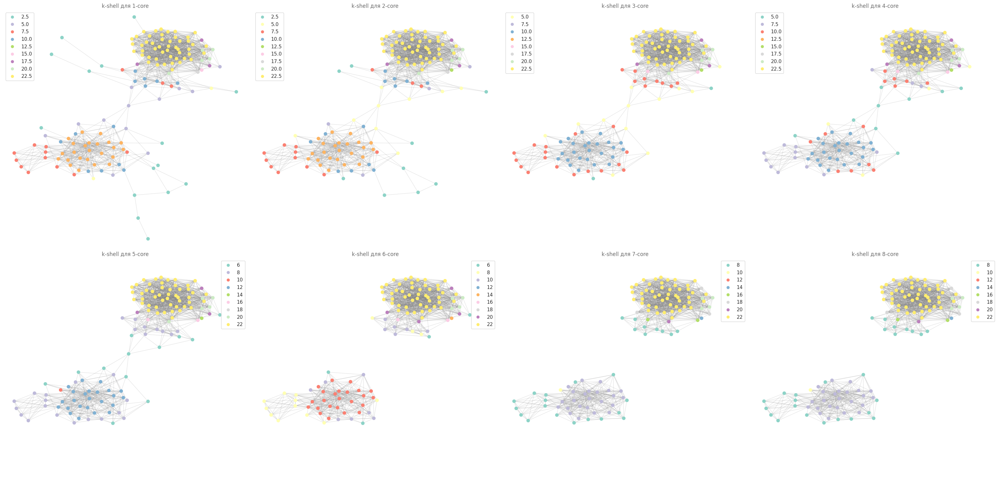

In [ ]:
def k_core_decompose(G):
    return np.array(list(nx.core_number(G).values()))

plt.figure(figsize=(32, 16))

x_max, y_max = np.array(list(lespos.values())).max(axis=0)
x_min, y_min = np.array(list(lespos.values())).min(axis=0)

for i in range(8):
    plt.subplot(2, 4, i + 1)
    subG = nx.k_core(lesG, i + 1)
    nodes = nx.draw_networkx_nodes(
        subG,
        lespos,
        cmap=plt.cm.Set3,
        node_color=k_core_decompose(subG),
        node_size=50,
        alpha=1
    )
    nx.draw_networkx_edges(
        subG,
        lespos,
        alpha=0.2,
        edge_color="gray"
    )
    eps = (x_max - x_min) * 0.05
    plt.xlim(x_min - eps, x_max + eps)
    plt.ylim(y_min - eps, y_max + eps)
    plt.axis("off")
    plt.title(f'k-shell для {i + 1}-core', fontsize=12, color="dimgray")
    plt.legend(*nodes.legend_elements())

plt.tight_layout()
plt.savefig("k_core_visualization_with_legend.png", dpi=300)
plt.show()


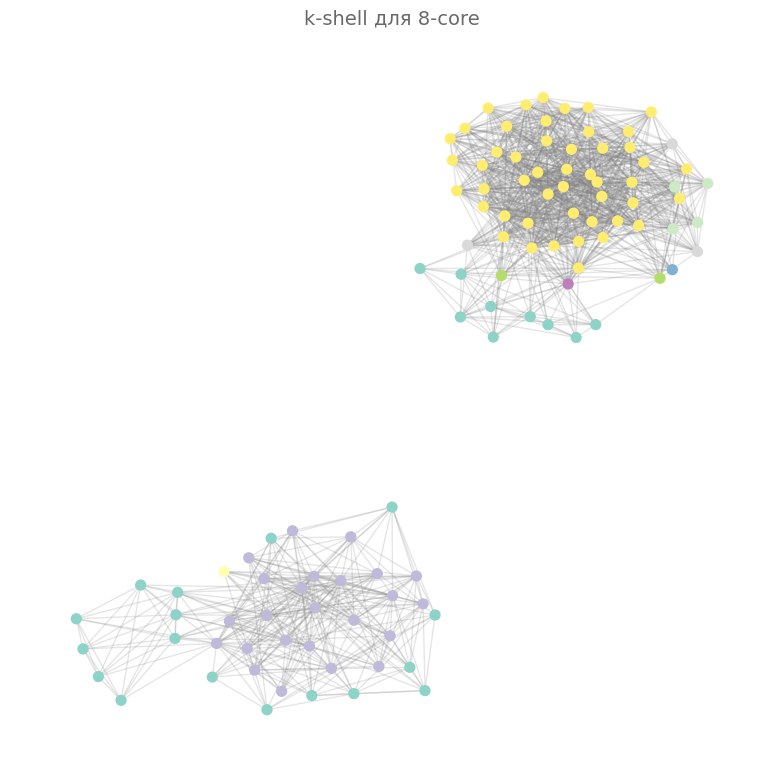

In [ ]:
plt.figure(figsize=(8, 8))

subG = nx.k_core(lesG, 8)
nodes = nx.draw_networkx_nodes(
    subG,
    lespos,
    cmap=plt.cm.Set3,
    node_color=k_core_decompose(subG),
    node_size=50,
    alpha=1
)
nx.draw_networkx_edges(
    subG,
    lespos,
    alpha=0.2,
    edge_color="gray"
)
plt.axis("off")
plt.title("k-shell для 8-core", fontsize=14, color="dimgray")
# plt.legend(*nodes.legend_elements(), loc="upper left")

plt.tight_layout()
plt.savefig("k_core_visualization_8_core.png", dpi=300)
plt.show()

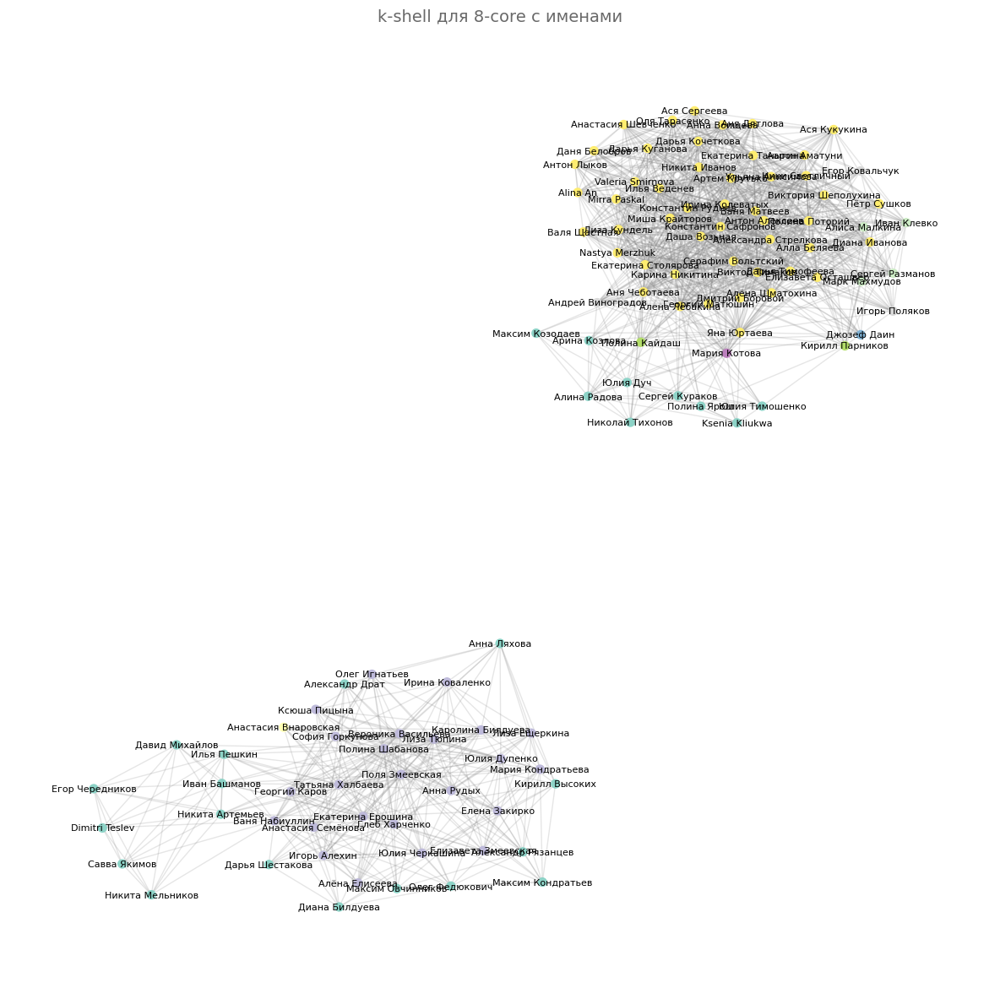

In [ ]:
original_to_reindexed = {original: reindexed for reindexed, original in enumerate(G.nodes())}
reindexed_to_original = {v: k for k, v in original_to_reindexed.items()}

subG = nx.k_core(lesG, 8)

node_labels = get_node_labels(G)
subG_labels = {
    node: node_labels[reindexed_to_original[node]]
    for node in subG.nodes
}

# Визуализация с именами и фамилиями
plt.figure(figsize=(12, 12))
nx.draw_networkx_nodes(
    subG,
    lespos,
    cmap=plt.cm.Set3,
    node_color=k_core_decompose(subG),
    node_size=50,
    alpha=1
)
nx.draw_networkx_edges(
    subG,
    lespos,
    alpha=0.2,
    edge_color="gray"
)

nx.draw_networkx_labels(
    subG,
    lespos,
    labels=subG_labels,
    font_size=8,
    font_color="black"
)

plt.axis("off")
plt.title("k-shell для 8-core с именами", fontsize=14, color="dimgray")

plt.tight_layout()
plt.savefig("k_core_visualization_8_core_with_labels_fixed.png", dpi=300)
plt.show()

In [ ]:
node_k_core_info = [
    {"Имя и Фамилия": subG_labels[node], "K-core": k_core_decompose(subG)[i]}
    for i, node in enumerate(subG.nodes)
]
node_k_core_table = pd.DataFrame(node_k_core_info)
node_k_core_table

,Имя и Фамилия,K-core
0,Алена Лебакина,23
1,Аня Чеботаева,23
2,Константин Сафронов,23
3,Dimitri Teslev,8
4,Алёна Шматохина,23
...,...,...
105,Лиза Ещеркина,11
106,Виктор Тимаков,23
107,Valeria Smirnova,23
108,Каролина Билдуева,11


#### Agglomerative clustering

In [ ]:
def simrank_distance(G):
    sim_matrix = nx.simrank_similarity(G)

    nodes = list(G.nodes())
    n = len(nodes)

    distance_matrix = np.zeros((n, n))

    for i, u in enumerate(nodes):
        for j, v in enumerate(nodes):
            if u == v:
                distance_matrix[i, j] = 0
            else:
                simrank_value = sim_matrix.get(u, {}).get(v, 0)
                distance_value = 1 - simrank_value
                distance_matrix[i, j] = distance_value
                distance_matrix[j, i] = distance_value
    return distance_matrix

In [ ]:
distance = simrank_distance(lesG)

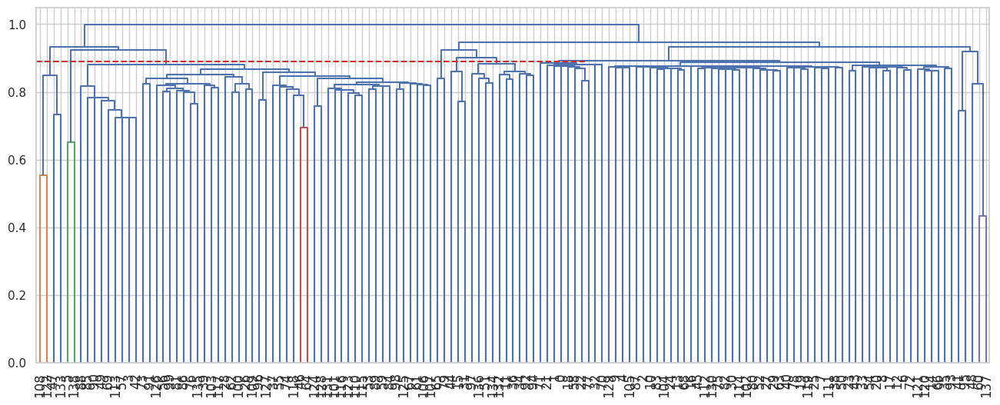

In [ ]:
plt.figure(figsize=(16, 6))
linked = linkage(squareform(distance), 'complete')
dendrogram(linked, labels=list(lesG.nodes),
           leaf_font_size=12)
plt.plot([0, 800], [0.89, 0.89], linestyle='--', c='tab:red')
plt.show()

In [ ]:
def agglomerative_clustering(distance, max_distance):
    clustering = AgglomerativeClustering(
        n_clusters=None,
        metric='precomputed',
        linkage='complete',
        distance_threshold=max_distance)

    labels = clustering.fit_predict(distance)
    return labels

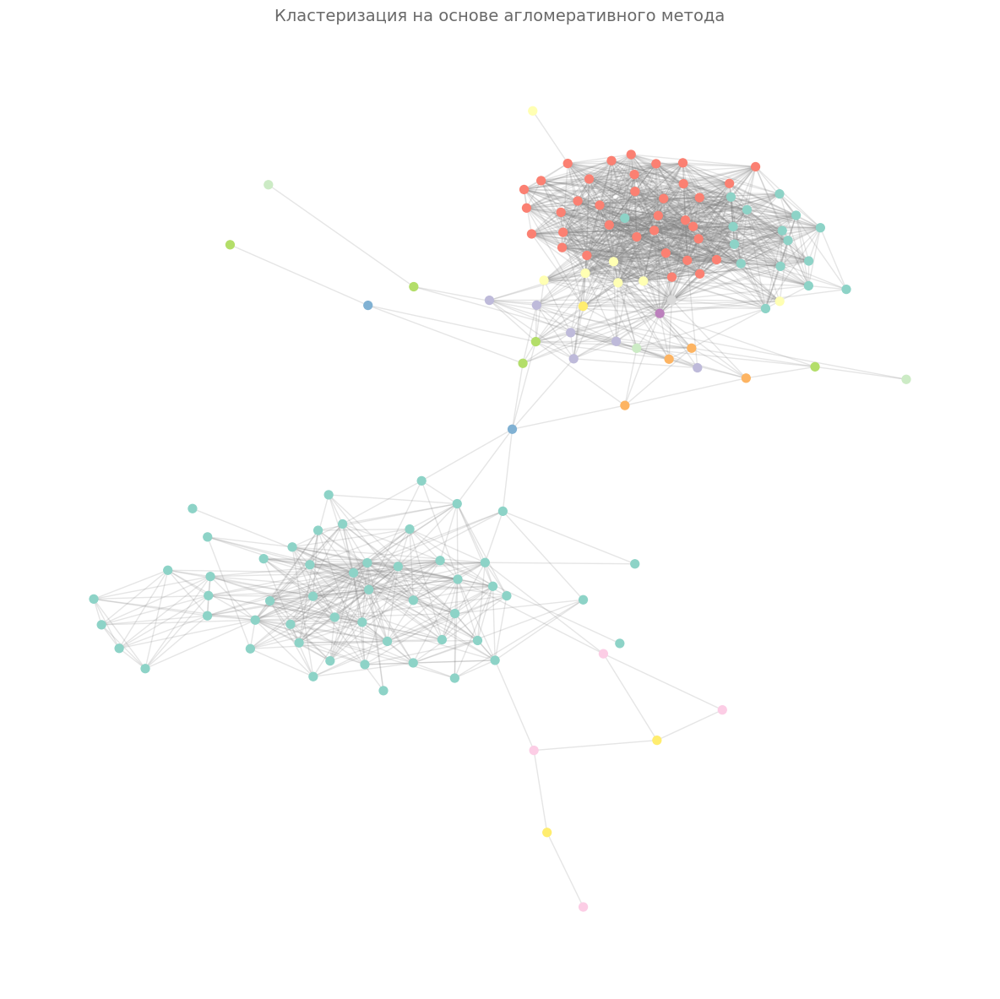

In [ ]:
labels = agglomerative_clustering(distance, 0.88)
plt.figure(figsize=(12, 12))
nx.draw_networkx_nodes(
    lesG,
    lespos,
    cmap=plt.cm.Set3,
    node_color=labels,
    node_size=50,
    alpha=1
)
nx.draw_networkx_edges(
    lesG,
    lespos,
    alpha=0.2,
    edge_color="gray"
)
plt.axis("off")
plt.title("Кластеризация на основе агломеративного метода", fontsize=14, color="dimgray")

plt.tight_layout()
plt.savefig("agglomerative_clustering_visualization.png", dpi=300)
plt.show()

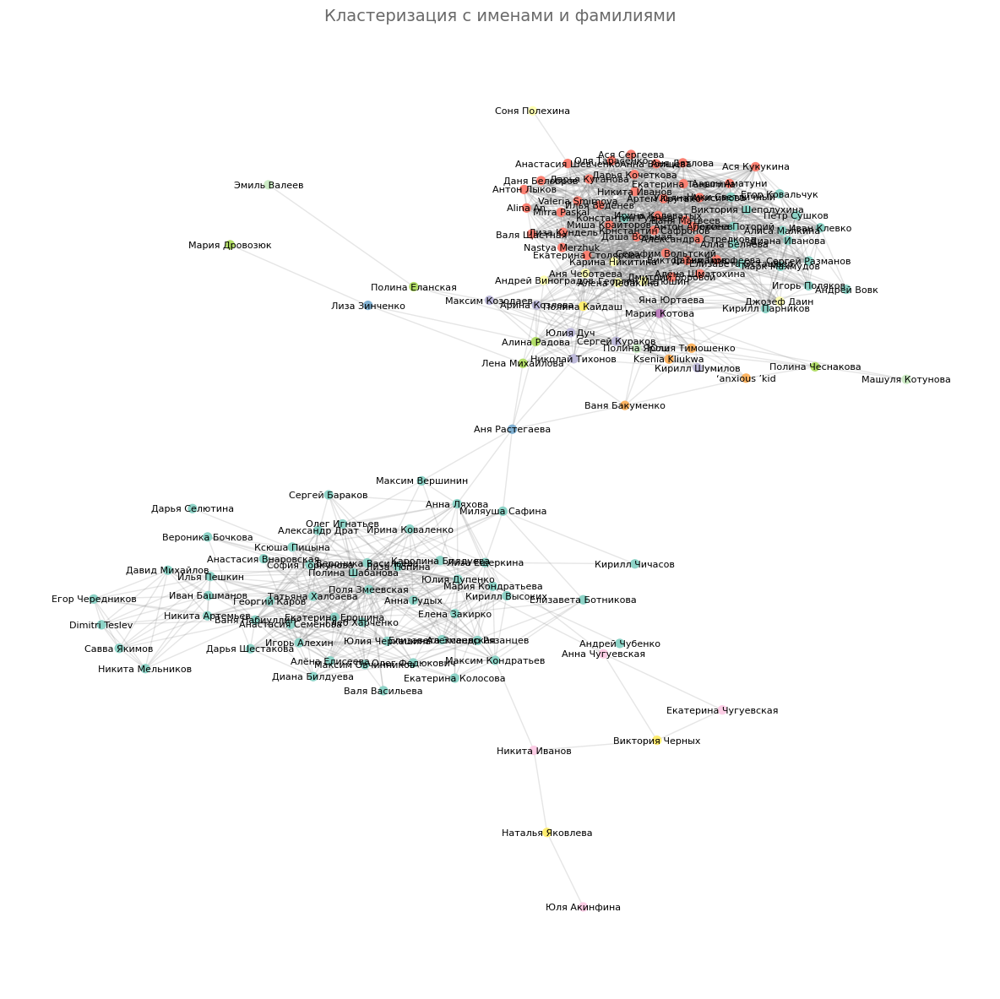

In [ ]:
node_labels = get_node_labels(G)
reindexed_to_original = {reindexed: original for reindexed, original in enumerate(G.nodes())}
lesG_labels = {
    node: node_labels[reindexed_to_original[node]]
    for node in lesG.nodes
}

plt.figure(figsize=(12, 12))
nx.draw_networkx_nodes(
    lesG,
    lespos,
    cmap=plt.cm.Set3,
    node_color=labels,
    node_size=50,
    alpha=1
)
nx.draw_networkx_edges(
    lesG,
    lespos,
    alpha=0.2,
    edge_color="gray"
)
nx.draw_networkx_labels(
    lesG,
    lespos,
    labels=lesG_labels,
    font_size=8,
    font_color="black"
)
plt.axis("off")
plt.title("Кластеризация с именами и фамилиями", fontsize=14, color="dimgray")

plt.tight_layout()
plt.savefig("agglomerative_clustering_with_labels.png", dpi=300)
plt.show()

In [ ]:
cluster_info = [
    {"Имя и Фамилия": lesG_labels[node], "Кластер": labels[node]}
    for node in lesG.nodes
]
cluster_table = pd.DataFrame(cluster_info)
cluster_table

,Имя и Фамилия,Кластер
0,Алена Лебакина,2
1,Аня Чеботаева,2
2,Константин Сафронов,4
3,Dimitri Teslev,0
4,Алёна Шматохина,4
...,...,...
134,Ksenia Kliukwa,6
135,Валя Васильева,0
136,‘anxious ’kid,6
137,Машуля Котунова,12


#### Оценка girvan_newman

In [ ]:
## вычисление и визуализация модульности алгоритма Girvan-Newman:
def expected_edges(A, m):
    k = A.sum(axis=1)
    expected = np.outer(k, k) / (2 * m)
    return expected

def kronecker(A, communities):
    n = A.shape[0]
    kd = np.zeros((n, n))
    for community in communities:
        for i in community:
            for j in community:
                kd[i, j] = 1
    return kd

def modularity(A, communities):
    m = A.sum() / 2
    res = (A - expected_edges(A, m)) * kronecker(A, communities)
    return res.sum() / (2 * m)

def edge_betw_modularity(G, n):
    m = G.number_of_edges()
    A = nx.to_numpy_array(G)
    mod_values = np.zeros(n)

    for i in range(n):
        remove_bridges(G)
        communities = [list(cc) for cc in nx.connected_components(G)]
        mod_values[i] = modularity(A, communities)

    return mod_values

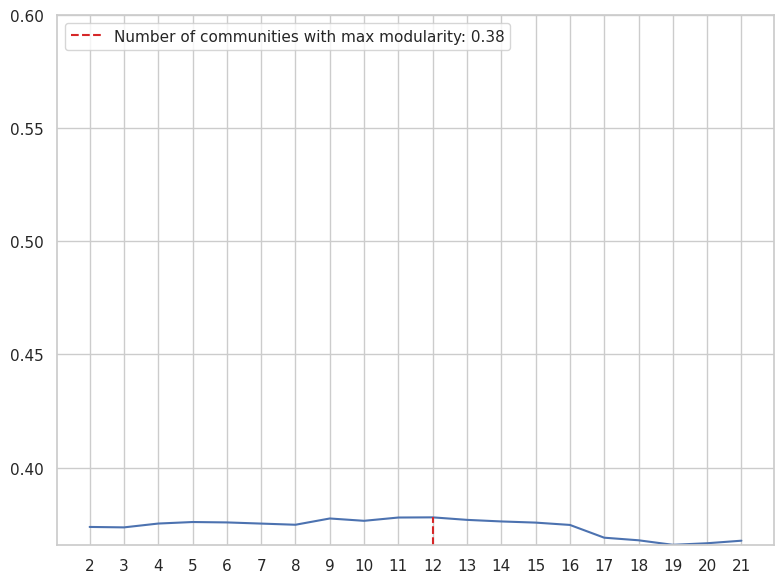

In [ ]:
n_iterations = 20
A = nx.to_numpy_array(lesG)
m = lesG.number_of_edges()

mod_val = edge_betw_modularity(lesG.copy(), n_iterations)

plt.figure(figsize=(8, 6))
plt.plot(np.arange(n_iterations) + 2, mod_val)
best_n = np.argmax(mod_val) + 2
label = f'Number of communities with max modularity: {max(mod_val):.2f}'
plt.plot(
    [best_n, best_n], [mod_val.min(), mod_val.max()],
    linestyle="--", c="tab:red", label=label
)

plt.legend(loc="upper left")
plt.xticks(np.arange(n_iterations) + 2)
plt.ylim((mod_val.min(), 0.6))

plt.tight_layout()
plt.savefig("girvan_newman_modularity.png", dpi=300)
plt.show()
